# Imports

In [1]:
import torch

print(torch.cuda.is_available())
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0))

True
2
NVIDIA GeForce RTX 3090


In [2]:
from orbit_generation.constants import EM_MU
from orbit_generation.data import TSFeatureWiseScaler, create_dataloaders, discard_random_labels, remove_duplicates_preserve_order, order_labels_and_array_with_target
from orbit_generation.processing import reorder_orbits, interpolate_equal_times
from orbit_generation.visualize import export_dynamic_orbits_html, plot_corr_matrix, visualize_static_orbits, export_dynamic_orbits_html
from orbit_generation.stats import plot_histograms_comparison
from orbit_generation.dataset import get_first_period_dataset, get_orbit_classes
from orbit_generation.model_factory import get_model
from orbit_generation.architectures import VAELossHistory
from orbit_generation.propagation import jacobi_constant, calculate_errors_per_orbit
from orbit_generation.experiment import setup_new_experiment, add_experiment_metrics, get_experiment_data
from orbit_generation.evaluation import evaluate_clustering_multiple_labels, find_nearest_orbits_batch, calculate_pairwise_orbit_distances, calculate_distances_batch, find_nearest_points_batch, calculate_pairwise_distances, find_nearest_orbits
from orbit_generation.latent_space import sample_random_distributions, plot_2d_latent_space, plot_combined_2d_latent_space, reduce_dimensions_latent_space, compute_centroids, grid_sample, reduce_dimensions_combined_latent_space
from orbit_generation.convergence import process_diferential_correction_orbits

In [3]:
import numpy as np
import os
from pytorch_lightning import Trainer

In [4]:
import pandas as pd

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [5]:
import logging

logging.basicConfig(level=logging.ERROR)
logger = logging.getLogger(__name__)

# Parameters

In [49]:
data_path = r"/orbit-generation/data/orbits_fix_1500/EM_N_fix_1500.h5"
experiments_folder = "../experiments"

The following cell will be overriden by the '03_02_experiment_parameterization' script

In [50]:
# parameters
data_used = "default_data"
families_to_discard = 0
seq_len = 100
feature_dim = 7
epochs = 3
val_split = 0.05
batch_size = 32
lr = 0.001
model_name = "inception_time_wp_vae"
latent_dim = 6
model_kwargs = {'beta': 1, 'n_filters': 32, 'kernel_sizes': [3, 5, 13], 'bottleneck_channels': 32}
max_iter_convergence = 25
input_seq_len_convergence = 1
samples_to_generate = 100
distance_metric = "euclidean"
want_to_train = False
want_to_generate = True
want_to_get_cluster_metrics = False
want_to_perform_convergence = False
want_to_discover = False

In [51]:
# Construct the params dictionary
params = {
    # Data
    'data_used': data_used,
    'families_to_discard': families_to_discard,
    'seq_len': seq_len,
    'feature_dim': feature_dim,
    # Training
    'epochs': epochs,
    'val_split': val_split,
    'batch_size': batch_size,
    'lr': lr,
    # Model
    'model_name': model_name,
    'latent_dim': latent_dim,
    # Convergence
    'max_iter_convergence': max_iter_convergence,
    'input_seq_len_convergence': input_seq_len_convergence,
    # Evaluation
    'samples_to_generate': samples_to_generate,
    'distance_metric': distance_metric,
    # Model Hyperparameters
    'model_kwargs': model_kwargs
}

In [52]:
params = {
            "data_used": "EM_N_fix_1500",
            "families_to_discard": 5,
            "seq_len": 100,
            "feature_dim": 7,
            "epochs": 50,
            "val_split": 0.05,
            "batch_size": 32,
            "lr": 0.001,
            "model_name": "vae_conv5_legit",
            "latent_dim": 6,
            "max_iter_convergence": 20,
            "input_seq_len_convergence": 1,
            "samples_to_generate": 100,
            "distance_metric": "euclidean",
            "model_kwargs": {
                "dropout_rate": 0.2,
                "beta": 0.001
            }
        }

# Saving paths

In [53]:
# Experiment
experiment_folder = setup_new_experiment(params, experiments_folder)
images_folder = os.path.join(experiment_folder, 'images')
if not os.path.exists(images_folder):
    os.makedirs(images_folder)
experiment_id = int(os.path.basename(experiment_folder).split('_')[1])

Parameters already exist for experiment: ../experiments/experiment_36


In [54]:
# Images
## Orbits
static_all_orbit_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits.png')
dynamic_orbits_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits.html')
refined_orbits_path = os.path.join(images_folder, f'exp{experiment_id}_refined_orbits.png')
dynamical_refined_orbits_path = os.path.join(images_folder, f'exp{experiment_id}_refined_orbits.html')
generated_orbits_that_converged_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits_that_converged.png')
generated_orbits_that_did_not_converged_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits_that_not_converged.png')
## Latent Spaces
latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_latent_space')
full_latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_full_latent_space')
discarded_latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_discarded_latent_space')
combined_latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_combined_latent_space')
combined_latent_space_arrows_path = os.path.join(images_folder, f'exp{experiment_id}_combined_latent_space_arrows')
family_centroids_plot_path = os.path.join(images_folder, f'exp{experiment_id}_family_centroids')
full_family_centroids_plot_path = os.path.join(images_folder, f'exp{experiment_id}_full_family_centroids')
## Feature Spaces
features_plot_path = os.path.join(images_folder, f'exp{experiment_id}_features')
family_feature_centroids_plot_path = os.path.join(images_folder, f'exp{experiment_id}_family_feature_centroids')
## Other
model_losses_path = os.path.join(images_folder, f'exp{experiment_id}_model_losses.png')
histogram_comparison_path = os.path.join(images_folder, f'exp{experiment_id}_histogram_comparison.png')
full_histogram_comparison_path = os.path.join(images_folder, f'exp{experiment_id}_full_histogram_comparison.png')

# Model
model_save_path = os.path.join(experiment_folder, f'exp{experiment_id}_model.pth')

# Orbits
generated_data_path = os.path.join(experiment_folder, f'exp{experiment_id}_generated_orbits.npy')
refined_data_path = os.path.join(experiment_folder, f'exp{experiment_id}_refined_orbits.npy')

# Latent Representations
latent_representations_path = os.path.join(experiment_folder, f'exp{experiment_id}_latent_representations.npy')
family_centroids_path = os.path.join(experiment_folder, f'exp{experiment_id}_family_centroids.npy')

# Features
generation_df_path = os.path.join(experiment_folder, f'exp{experiment_id}_generation_df.csv')
refined_orbits_df_path = os.path.join(experiment_folder, f'exp{experiment_id}_refined_orbits_df.csv')


# Data

## Import

In [55]:
full_data, full_orbit_df, full_labels, system_dict = get_first_period_dataset(file_path=data_path, segment_length=params['seq_len'])
full_data.shape

(45211, 7, 100)

Remove the time variable if specified in params

In [56]:
if params['feature_dim']==6:
    full_data=full_data[:,1:,:]
    full_data.shape

Remove specific families from the training data

In [57]:
full_orbits_id_classes = [full_orbit_df.at[index, 'id_class'] for index in full_labels]

if want_to_discover:
    discarded_family_ids, data, orbits_id_classes = discard_random_labels(full_data, np.array(full_orbits_id_classes), int(params['families_to_discard']))
    discarded_families = get_orbit_classes(discarded_family_ids)[0]
    orbit_df = full_orbit_df[~full_orbit_df['id_class'].isin(discarded_family_ids)]
    add_experiment_metrics(experiments_folder, experiment_id=experiment_id,
                           metrics={'discarded_family_ids':discarded_family_ids, 'discarded_families':discarded_families})

else:
    experiment_data = get_experiment_data(experiments_folder=experiments_folder, experiment_id=experiment_id)
    discarded_family_ids = experiment_data.get('discarded_family_ids', {})  
    discarded_family_ids, data, orbits_id_classes = discard_random_labels(full_data, np.array(full_orbits_id_classes), discarded_family_ids)
    discarded_families = get_orbit_classes(discarded_family_ids)[0]
    orbit_df = full_orbit_df[~full_orbit_df['id_class'].isin(discarded_family_ids)]

discarded_families

['S_DS', 'S_LPOW', 'S_L2_L', 'S_L1_V', 'S_L4_A']

Get Features

In [58]:
family_labels = get_orbit_classes(orbits_id_classes)[0]

feature_names=['jacobi', 'period', 'stability']
features=orbit_df[feature_names].to_numpy()

## Scaling

In [59]:
scaler = TSFeatureWiseScaler()        
scaled_data = scaler.fit_transform(torch.tensor(data, dtype=torch.float32))
scaled_data.shape

torch.Size([39247, 7, 100])

# Modelling

In [60]:
model = get_model(params)

In [61]:
if want_to_train:
    train_loader, val_loader = create_dataloaders(scaled_data, val_split=params.get('val_split', 0.1), batch_size=params.get('batch_size', 32))

    loss_history = VAELossHistory()

    trainer = Trainer(
        max_epochs=params.get('epochs', 10),
        log_every_n_steps=10,
        devices="auto",
        accelerator="auto",
        enable_progress_bar=True,
        enable_model_summary=True,
        callbacks=[loss_history]
    )

    trainer.fit(model, train_loader, val_loader)

    for metric_name, metric_value in trainer.callback_metrics.items():
        print(f"{metric_name}: {metric_value}")

In [62]:
if want_to_train:
    add_experiment_metrics(experiments_folder, experiment_id=experiment_id, metrics=trainer.callback_metrics)
    torch.save(model.state_dict(), model_save_path)
    loss_history.plot_all_losses(save_path=model_losses_path)
else:
    model.load_state_dict(torch.load(model_save_path, weights_only=True))  

# Latent Space

## Dataset

In [63]:
latent_means, latent_log_vars = model.encode(scaled_data)

latent_means = latent_means.detach().numpy()
latent_log_vars = latent_log_vars.detach().numpy()
latent_representation = np.concatenate((latent_means, latent_log_vars), axis=1)
np.save(latent_representations_path, latent_representation)
latent_representation.shape

(39247, 12)

In [64]:
latent_log_vars = torch.from_numpy(latent_log_vars)
latent_stdevs = torch.exp(0.5 * latent_log_vars)
latent_stdevs = latent_stdevs.numpy()
latent_stdevs.shape

(39247, 6)

In [65]:
features.shape

(39247, 3)

Saved grid plot to ../experiments/experiment_36/images/exp36_latent_space.png


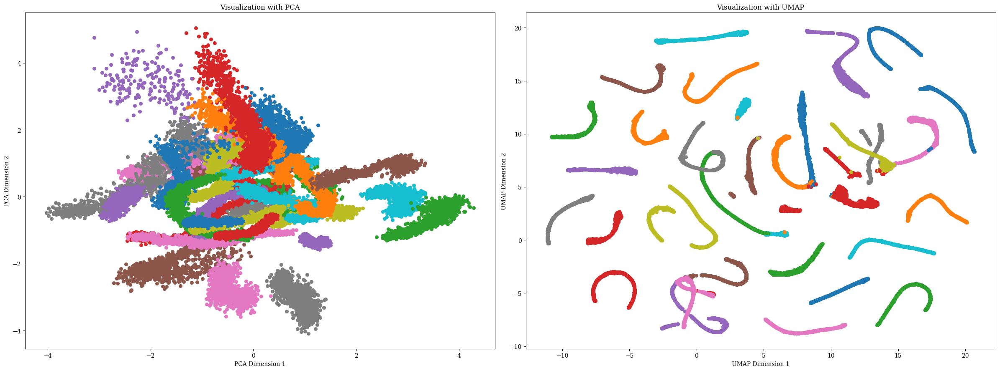

In [66]:
if latent_means.shape[1]==2:
    plot_2d_latent_space(latent_means,
                            np.array(family_labels),
                            save_path=latent_space_path,
                            features=features,
                            feature_names=feature_names,
                            plot_std=True)
else:
    rls=reduce_dimensions_latent_space(latent_means,
                                        np.array(family_labels),
                                        techniques=['PCA','UMAP'],
                                        save_path=latent_space_path,
                                        show_legend=False)

### Full Dataset

In [67]:
# Scale full data
full_scaled_data = scaler.transform(torch.tensor(full_data, dtype=torch.float32))

# Encode full data
full_latent_means, full_latent_log_vars= model.encode(full_scaled_data)

full_latent_means = full_latent_means.detach().numpy()

# Calculate stdevs
full_latent_stdevs = torch.exp(0.5 * full_latent_log_vars)
full_latent_stdevs = full_latent_stdevs.detach().numpy()
full_latent_stdevs.shape

(45211, 6)

In [68]:
full_family_labels=get_orbit_classes(full_orbits_id_classes)[0]
family_labels_discarded_train = [label if label in discarded_families else 'training' for label in full_family_labels]
family_labels_discarded_train = np.array(family_labels_discarded_train)
family_labels_discarded_train.shape

(45211,)

In [69]:
full_features=full_orbit_df[feature_names].to_numpy()
full_features.shape

(45211, 3)

In [70]:
if full_latent_means.shape[1]==2 and params['families_to_discard']!=0:
    plot_2d_latent_space(full_latent_means,
                            family_labels_discarded_train,
                            save_path=full_latent_space_path,
                            features=full_features,
                            feature_names=feature_names,
                            plot_std=True,
                            latent_stdevs=full_latent_stdevs)

In [71]:
discarded_orbit_indices = [i for i in range(len(family_labels_discarded_train)) if family_labels_discarded_train[i] != 'training']

if full_latent_means.shape[1]==2 and params['families_to_discard']!=0:
    plot_2d_latent_space(full_latent_means[discarded_orbit_indices],
                            family_labels_discarded_train[discarded_orbit_indices],
                            save_path=discarded_latent_space_path,
                            features=full_features[discarded_orbit_indices],
                            latent_stdevs=full_latent_stdevs[discarded_orbit_indices])


## Centroids

In [72]:
# Compute centroids
centroid_means = compute_centroids(latent_means, orbits_id_classes, method='mean')
centroid_log_vars = compute_centroids(latent_log_vars, orbits_id_classes, method='mean')
centroids_representation = np.concatenate((centroid_means, centroid_log_vars), axis=1)
np.save(family_centroids_path, centroids_representation)
centroid_log_vars = torch.from_numpy(centroid_log_vars)
centroid_stdevs = torch.exp(0.5 * centroid_log_vars)
centroid_stdevs = centroid_stdevs.numpy()
centroid_stdevs.shape

(35, 6)

In [73]:
# Compute centroid labels
unique_classes = remove_duplicates_preserve_order(orbits_id_classes)
family_names=get_orbit_classes(unique_classes)[0]
len(family_names)

35

In [74]:
# Compute full data centroid
full_data_centroid = np.mean(latent_means, axis=0)
full_data_centroid

array([-0.4622852 , -0.38400057, -0.19459964, -0.16840394,  0.05436385,
        0.02459539], dtype=float32)

Saved grid plot to ../experiments/experiment_36/images/exp36_family_centroids.png


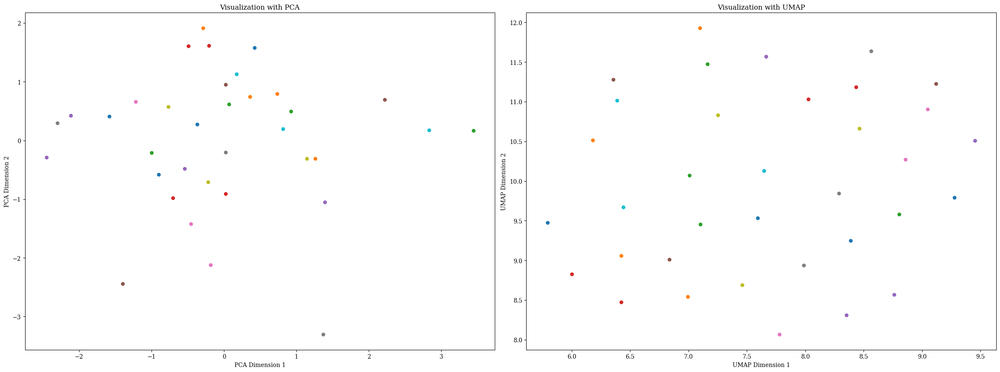

In [75]:
if latent_means.shape[1]==2:
    plot_2d_latent_space(centroid_means,
                            np.array(family_names),
                            save_path=family_centroids_plot_path,
                            latent_stdevs=centroid_stdevs
                            )
else:
    rls=reduce_dimensions_latent_space(centroid_means,
                                        np.array(family_names),
                                        techniques=['PCA','UMAP'],
                                        save_path=family_centroids_plot_path,
                                        show_legend=False)

### Full Centroids

In [76]:
# Compute centroids
full_centroid_means = compute_centroids(full_latent_means, full_orbits_id_classes, method='mean')
full_centroid_log_vars = compute_centroids(full_latent_log_vars.detach().numpy(), full_orbits_id_classes, method='mean')
full_centroid_stdevs = compute_centroids(full_latent_stdevs, full_orbits_id_classes, method='mean')
full_centroid_stdevs.shape

(40, 6)

In [77]:
# Calculate full centroid labels
full_unique_classes = remove_duplicates_preserve_order(full_orbits_id_classes)
full_family_names=get_orbit_classes(full_unique_classes)[0]
len(full_family_names)

40

In [78]:
families_discarded_train = [label if label in discarded_families else 'training' for label in full_family_names]
families_discarded_train = np.array(families_discarded_train)
len(families_discarded_train)

40

In [79]:
if full_centroid_means.shape[1]==2 and params['families_to_discard']!=0:
    plot_2d_latent_space(full_centroid_means,
                            families_discarded_train,
                            save_path=full_family_centroids_plot_path,
                            latent_stdevs=full_centroid_stdevs
                            )

In [80]:
discarded_family_indices = [i for i in range(len(families_discarded_train)) if families_discarded_train[i] != 'training']
discarded_centroid_means = full_centroid_means[discarded_family_indices]
discarded_centroid_log_vars = full_centroid_log_vars[discarded_family_indices]
discarded_centroid_log_vars.shape

(5, 6)

## Clustering

In [81]:
if want_to_get_cluster_metrics:
    cluster_metrics = evaluate_clustering_multiple_labels(latent_means, [family_labels], label_names=['family'], clustering_method='gmm')
    add_experiment_metrics(experiments_folder, experiment_id=experiment_id, metrics=cluster_metrics)

# Generation

Normal Sampling

In [82]:
if want_to_generate:
    random_generation = model.sample(params['samples_to_generate'])
    random_generation = scaler.inverse_transform(random_generation)
    print(random_generation.shape)

torch.Size([100, 7, 100])


Discarded Centroid Sampling

In [83]:
if want_to_generate:
    if params['families_to_discard']==0:
        discarded_centroids_generation = model.sample(params['samples_to_generate'])
    else:
        discarded_centroids_latent_samples = sample_random_distributions(discarded_centroid_means, discarded_centroid_log_vars, params['samples_to_generate'])
        discarded_centroids_generation = model.decode(discarded_centroids_latent_samples)
    discarded_centroids_generation = scaler.inverse_transform(discarded_centroids_generation)
    print(discarded_centroids_generation.shape)

torch.Size([100, 7, 100])


Grid Sampling

In [84]:
if want_to_generate:
    grid_samples = grid_sample(latent_means, grid_size=params['samples_to_generate'])
    grid_generation = model.decode(torch.from_numpy(grid_samples))
    grid_generation = scaler.inverse_transform(grid_generation)
    print(grid_generation.shape)

torch.Size([100, 7, 100])


/usr/local/lib/python3.10/dist-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Save or Load

In [86]:
if want_to_generate:
    generation = torch.cat([random_generation, discarded_centroids_generation, grid_generation], dim=0)
    generation = generation.detach().cpu().numpy()
    np.save(generated_data_path, generation)
else:
    generation = np.load(generated_data_path)
    

generation.shape

(300, 7, 100)

## Visualization

In [87]:
if torch.is_tensor(generation):
    generation=generation.detach().numpy()

if generation.shape[1] == 7:
    no_time_generation = generation[:,1:,:]
    generation.shape
else:
    no_time_generation = generation

no_time_generation.shape

(300, 6, 100)

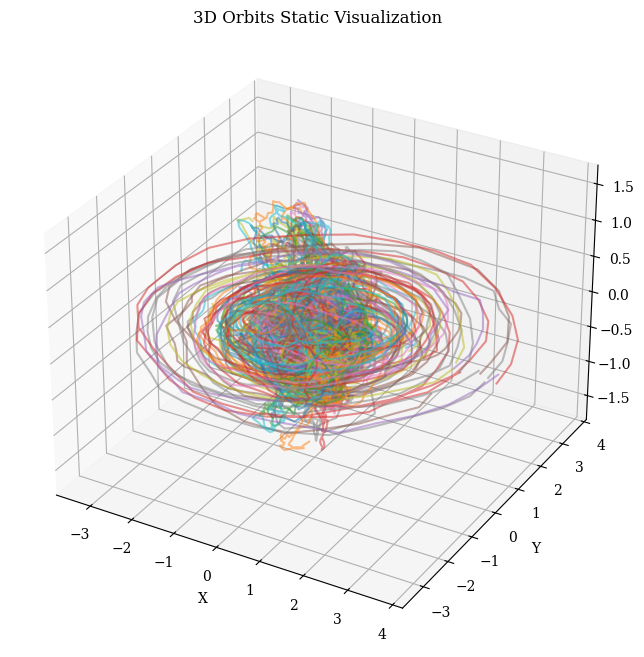

In [88]:
visualize_static_orbits(data= no_time_generation, show_legend=False, save_path=static_all_orbit_path)

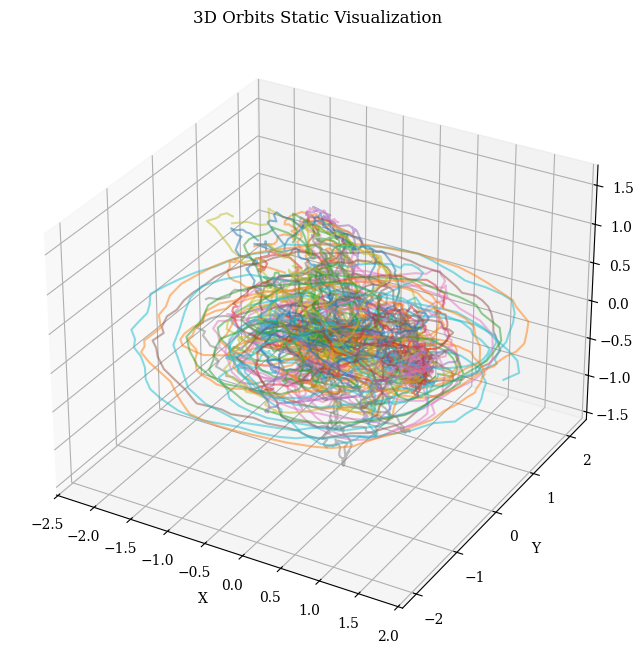

In [89]:
visualize_static_orbits(data= no_time_generation[0:100], show_legend=False)

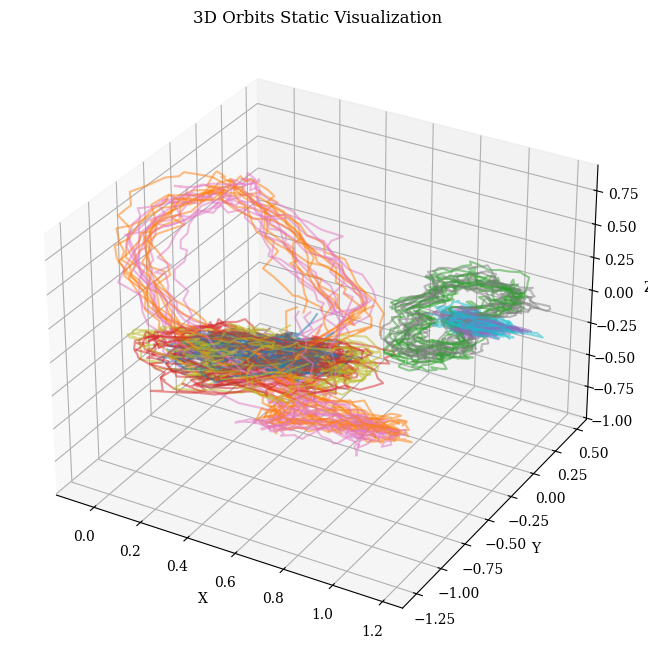

In [90]:
visualize_static_orbits(data= no_time_generation[100:200], show_legend=False)

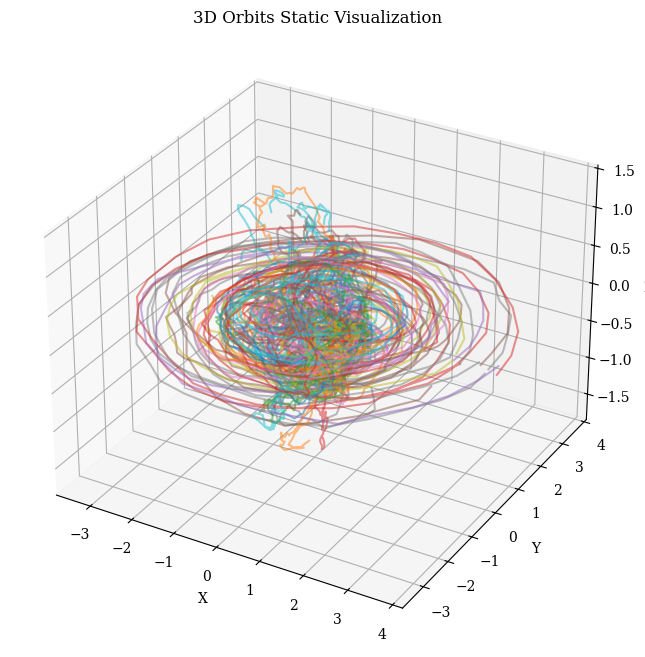

In [98]:
visualize_static_orbits(data= no_time_generation[200:300], show_legend=False)

In [103]:
export_dynamic_orbits_html(data=no_time_generation, filename=dynamic_orbits_path)

Visualization saved to ../experiments/experiment_36/images/exp36_generated_orbits.html


## Coverage

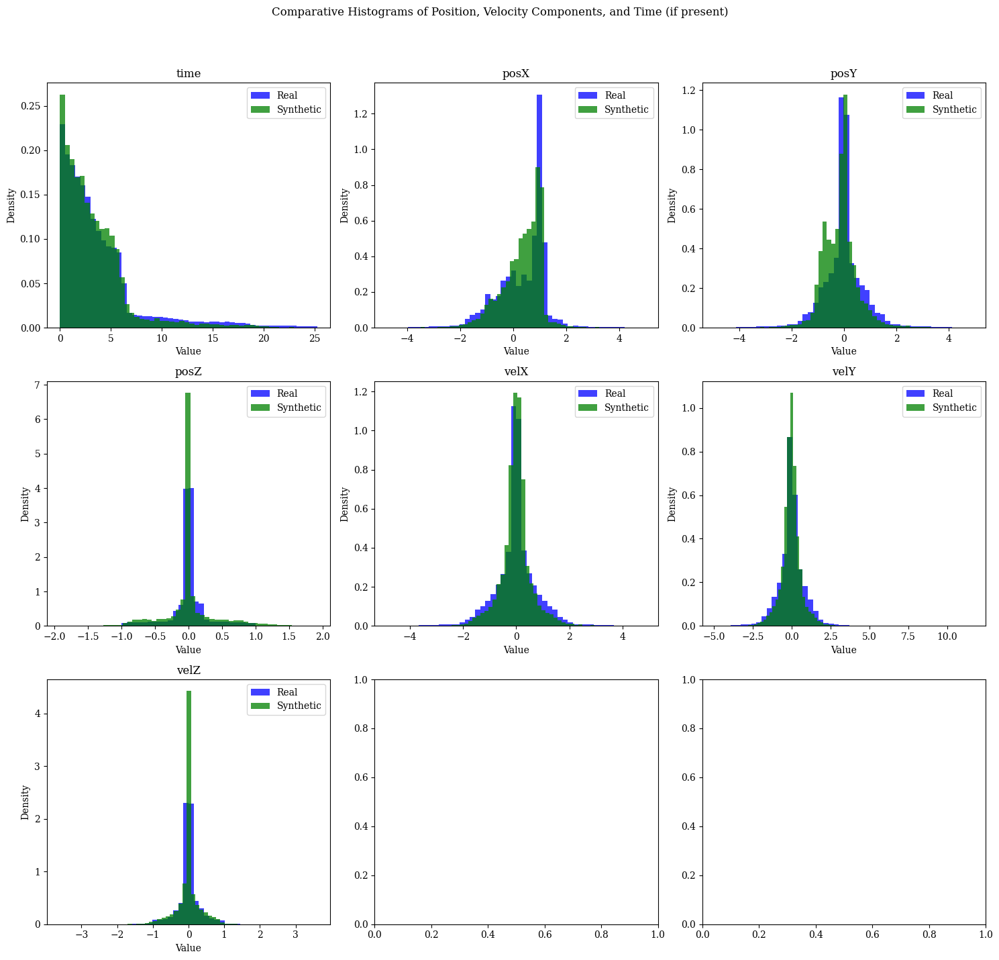

In [104]:
plot_histograms_comparison(data1=data, data2=generation, label1='Real', label2='Synthetic', normalize=True, save_path=histogram_comparison_path)

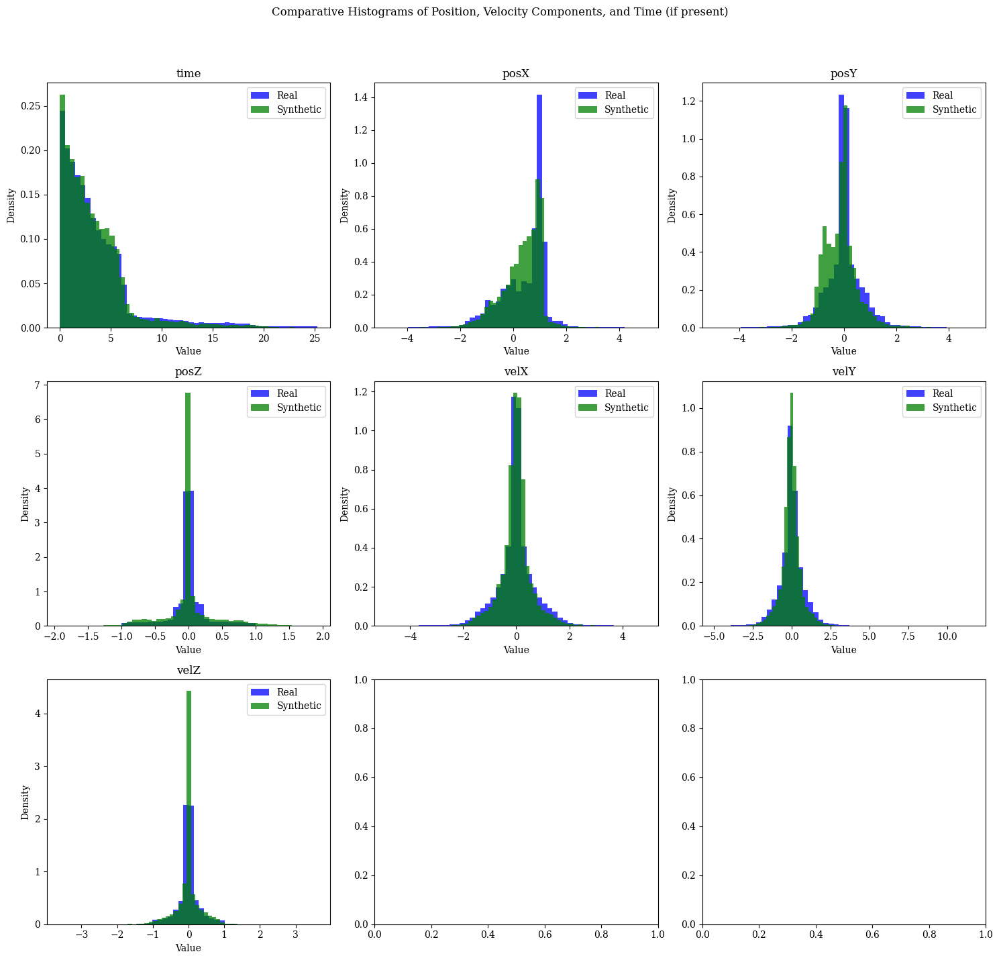

In [105]:
plot_histograms_comparison(data1=full_data, data2=generation, label1='Real', label2='Synthetic', normalize=True, save_path=full_histogram_comparison_path)

## Pheasibility

In [106]:
#Order metrics
reordered_generation, order_metrics_array, order_metric_labels = reorder_orbits(generation)
average_order_metrics = order_metrics_array.mean(axis=0)
average_order_metrics_dict = dict(zip(order_metric_labels, average_order_metrics))

In [107]:
if want_to_generate:
    # Pheasibility metrics
    per_orbit_errors = calculate_errors_per_orbit(reordered_generation,EM_MU)
    mean_errors = {key: np.mean(value) for key, value in per_orbit_errors.items()}
    
    generation_df = pd.DataFrame(per_orbit_errors)
    new_values_df = pd.DataFrame(order_metrics_array, columns=order_metric_labels)
    generation_df = pd.concat([generation_df, new_values_df], axis=1)

    add_experiment_metrics(experiments_folder, experiment_id=experiment_id, metrics={**mean_errors, **average_order_metrics_dict})

else:
    generation_df = pd.read_csv(generation_df_path)

Metrics added to experiment with ID 36 in ../experiments/experiments.json.


In [108]:
generation_df.head()

,position_error,velocity_error,energy_error,disorder_metric,correct_order,inversions,kendall_tau_distance
0,0.139224,0.242180,1.176531,176.0,78.0,119.0,0.048081
1,0.192839,0.349629,0.500636,150.0,71.0,95.0,0.038384
2,0.156858,0.293211,1.186323,296.0,67.0,189.0,0.076364
3,0.136351,0.212304,0.173753,454.0,65.0,324.0,0.130909
4,0.127103,0.208509,0.350759,128.0,77.0,81.0,0.032727


# Convergence

In [109]:
# Interpolate similar time values to suceed in convergence
interpolated_generation = interpolate_equal_times(reordered_generation)
interpolated_generation.shape

(300, 7, 100)

In [110]:
if want_to_perform_convergence:
    refined_orbits, refined_orbits_df= process_diferential_correction_orbits(np.transpose(interpolated_generation,(0,2,1)),
                                                                        EM_MU,
                                                                        max_iter=params['max_iter_convergence'])
    refined_orbits = np.transpose(refined_orbits,(0,2,1))
    np.save(refined_data_path, refined_orbits)
else:
    refined_orbits = np.load(refined_data_path)
    refined_orbits_df = pd.read_csv(refined_orbits_df_path)

refined_orbits.shape

(127, 7, 100)

Order Metrics

In [111]:
# Order orbits and average metrics
reordered_refined_orbits, refined_order_metrics_array, refined_order_metric_labels = reorder_orbits(refined_orbits)
refined_average_order_metrics = refined_order_metrics_array.mean(axis=0)
refined_order_metrics = dict(zip(refined_order_metric_labels, refined_average_order_metrics))

# Add individual metrics to the df
new_values_df = pd.DataFrame(refined_order_metrics_array, columns=refined_order_metric_labels)
refined_orbits_df = pd.concat([refined_orbits_df, new_values_df], axis=1)

refined_order_metrics

{'disorder_metric': np.float64(191.49606299212599),
 'correct_order': np.float64(75.22834645669292),
 'inversions': np.float64(127.33858267716535),
 'kendall_tau_distance': np.float64(0.05144993239481412)}

Pheasibility Metrics

In [112]:
refined_per_orbit_errors = calculate_errors_per_orbit(reordered_refined_orbits,EM_MU)
refined_orbits_df['propagated_position_error'] = refined_per_orbit_errors['position_error']
refined_orbits_df['propagated_velocity_error'] = refined_per_orbit_errors['velocity_error']
refined_orbits_df['propagated_energy_error'] = refined_per_orbit_errors['energy_error']
refined_mean_errors = {key: np.mean(value) for key, value in refined_per_orbit_errors.items()}
refined_mean_errors

{'position_error': np.float64(2.955096466180972e-12),
 'velocity_error': np.float64(6.073855200986512e-12),
 'energy_error': np.float64(6.587271499057514e-12)}

In [113]:
refined_orbits_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance,closest_family_full_centroid,closest_family_full_centroid_distance,family_of_feature_closest_orbit,family_of_closest_orbit,disorder_metric,correct_order,inversions,kendall_tau_distance
0,0,6.395186,6.302522,7,1.398596e-11,0.769955,-0.393026,0.352113,-0.005749,-0.803771,-0.795254,0.735167,-0.476966,0.470570,-0.008378,-0.863155,-0.870847,60.0,82.0,35.0,0.014141,1.202996e-12,2.607413e-12,4.593562e-12,0.425266,1.278837,0.092664,30810,0.000859,30787,1.967273,2.786773,2.498253,1.473080,22,1.045556,10,0.299181,0.177583,26,1.053487,29.0,29.0,60.0,82.0,35.0,0.014141
1,2,5.998624,6.255559,14,1.354334e-10,0.251780,0.041392,0.689512,0.042365,-0.958140,-0.089070,0.009184,0.019214,0.995652,0.038575,-1.011370,0.018985,246.0,66.0,163.0,0.065859,4.144731e-12,1.060093e-11,1.094821e-11,0.287149,0.988646,0.256935,24263,0.000219,24301,6.195145,6.856746,1.757369,1.731676,17,0.929396,10,0.182968,0.409377,20,0.926122,21.0,21.0,246.0,66.0,163.0,0.065859
2,3,5.981030,6.265392,11,2.048925e-11,-1.211178,0.040455,-0.025998,0.017210,1.422636,0.134127,-1.552693,-0.074010,-0.022109,-0.098701,1.704606,0.509757,112.0,77.0,75.0,0.030303,1.252723e-12,3.130156e-12,2.870088e-12,0.323473,0.543481,0.284362,19684,0.000526,19717,4.485208,5.281586,3.046467,2.106530,13,0.679406,15,0.169371,0.603150,16,0.682743,17.0,17.0,112.0,77.0,75.0,0.030303
3,4,3.780626,3.294795,8,8.885266e-11,1.299808,0.030334,-0.125091,0.034437,-0.423233,0.008879,1.163669,-0.001031,-0.114950,-0.000904,-0.203748,0.001111,232.0,69.0,148.0,0.059798,1.681428e-12,5.085804e-12,2.355566e-12,0.450959,3.112600,0.485831,14967,0.000247,16529,0.682594,2.393911,2.052801,4.021441,11,0.458928,27,0.595025,0.262876,13,0.457670,13.0,14.0,232.0,69.0,148.0,0.059798
4,7,12.725389,12.549174,18,2.991717e-10,0.499166,0.115313,-0.003062,0.056219,0.841462,-0.016488,0.409168,-0.079558,-0.008749,0.122948,1.385672,0.151695,68.0,85.0,38.0,0.015354,5.979997e-12,1.528911e-11,8.685658e-12,0.383508,2.876062,0.176215,41484,0.003867,41526,3.864567,4.026240,1.537191,5.316860,31,0.383732,36,0.440313,0.612380,36,0.386488,39.0,39.0,68.0,85.0,38.0,0.015354


In [114]:
refined_ids = refined_orbits_df['id'].astype(int).tolist()
generated_data_that_was_refined = generation[refined_ids]
generated_data_that_was_refined.shape

(127, 7, 100)

## Visualization

Refinement by Samplings

In [115]:
index_100 = refined_orbits_df[refined_orbits_df['id'] >= 100].index[0] if not refined_orbits_df[refined_orbits_df['id'] >= 100].empty else None
index_200 = refined_orbits_df[refined_orbits_df['id'] >= 200].index[0] if not refined_orbits_df[refined_orbits_df['id'] >= 200].empty else None

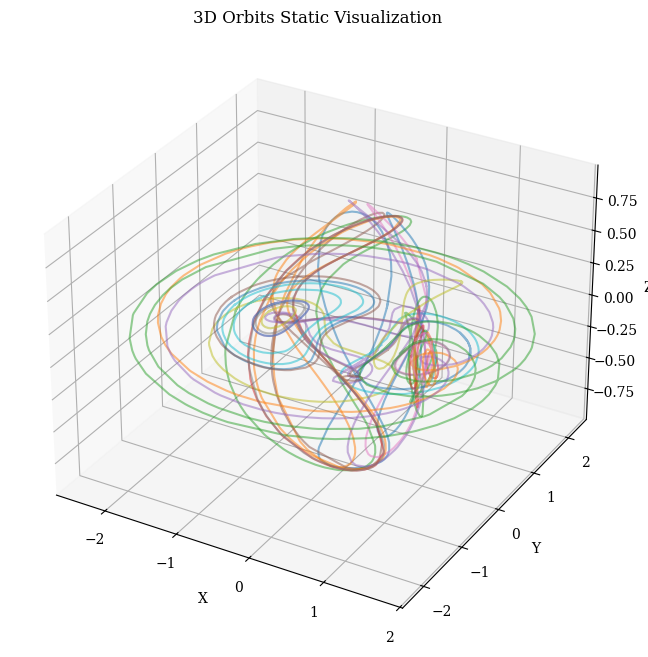

In [116]:
if np.any(reordered_refined_orbits[:index_100,1:,:]):
    visualize_static_orbits(reordered_refined_orbits[:index_100,1:,:], show_legend=False)

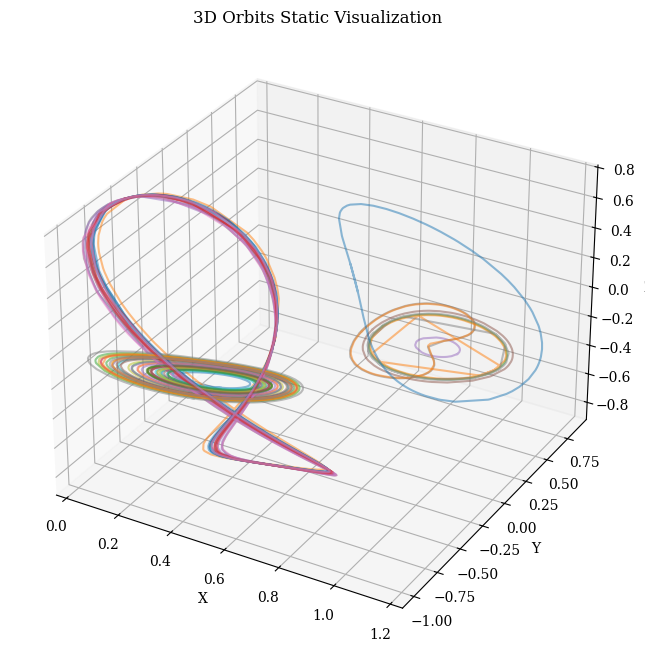

In [117]:
if np.any(reordered_refined_orbits[index_100:index_200,1:,:]):
    visualize_static_orbits(reordered_refined_orbits[index_100:index_200,1:,:], show_legend=False)

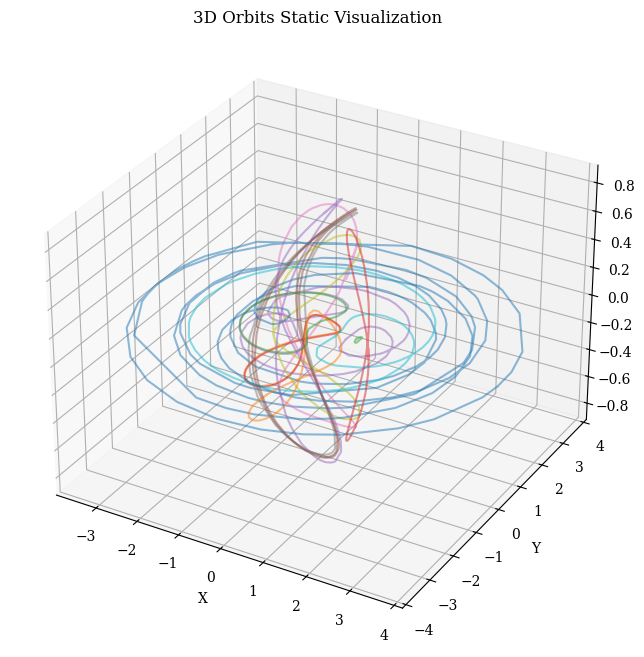

In [118]:
if np.any(reordered_refined_orbits[index_200:,1:,:]):
    visualize_static_orbits(reordered_refined_orbits[index_200:,1:,:], show_legend=False)

Generation that was able to get Refined

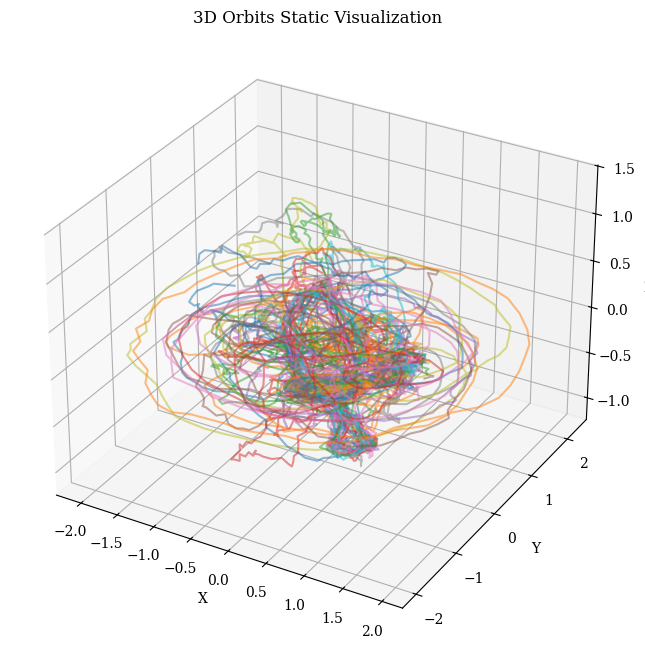

In [119]:
visualize_static_orbits(generated_data_that_was_refined[:,1:,:], show_legend=False, save_path=generated_orbits_that_converged_path)

Refinement

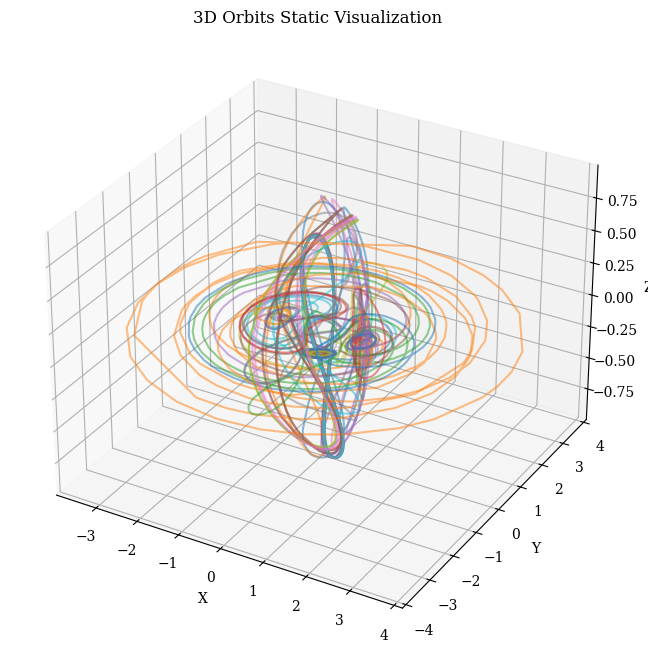

In [120]:
visualize_static_orbits(reordered_refined_orbits[:,1:,:], show_legend=False, save_path=refined_orbits_path)

Generation that didn't manage to get refined

In [121]:
non_refined_ids = sorted(set(range(3*params['samples_to_generate'])) - set(refined_ids))
generated_data_that_was_not_refined = generation[non_refined_ids]
generated_data_that_was_not_refined.shape

(173, 7, 100)

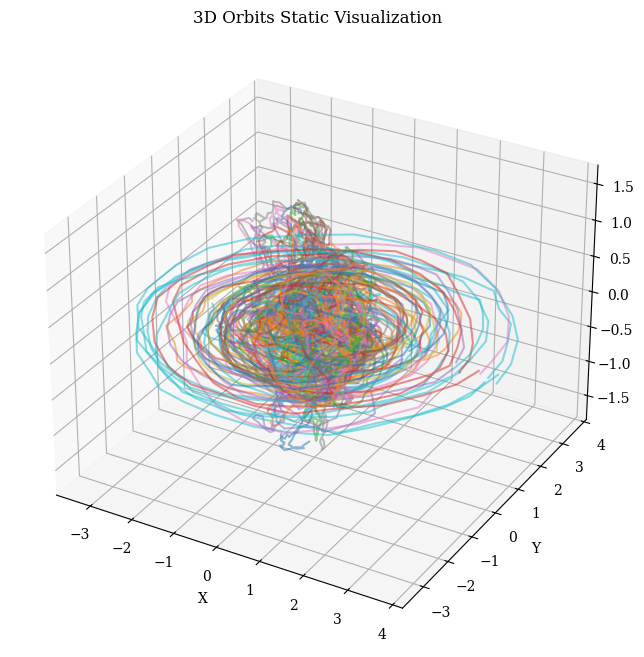

In [122]:
visualize_static_orbits(generated_data_that_was_not_refined[:,1:,:], show_legend=False, save_path=generated_orbits_that_did_not_converged_path)

## Latent Space

In [123]:
refined_scaled_data = scaler.transform(torch.from_numpy(refined_orbits).float())
refined_latent_means, refined_latent_log_vars = model.encode(refined_scaled_data)
refined_latent_means = refined_latent_means.detach().numpy()
refined_latent_log_vars = refined_latent_log_vars.detach().numpy()
refined_latent_representations = np.concatenate((refined_latent_means, refined_latent_log_vars), axis=1)
refined_latent_representations.shape

(127, 12)

Saved plot to ../experiments/experiment_36/images/exp36_combined_latent_space


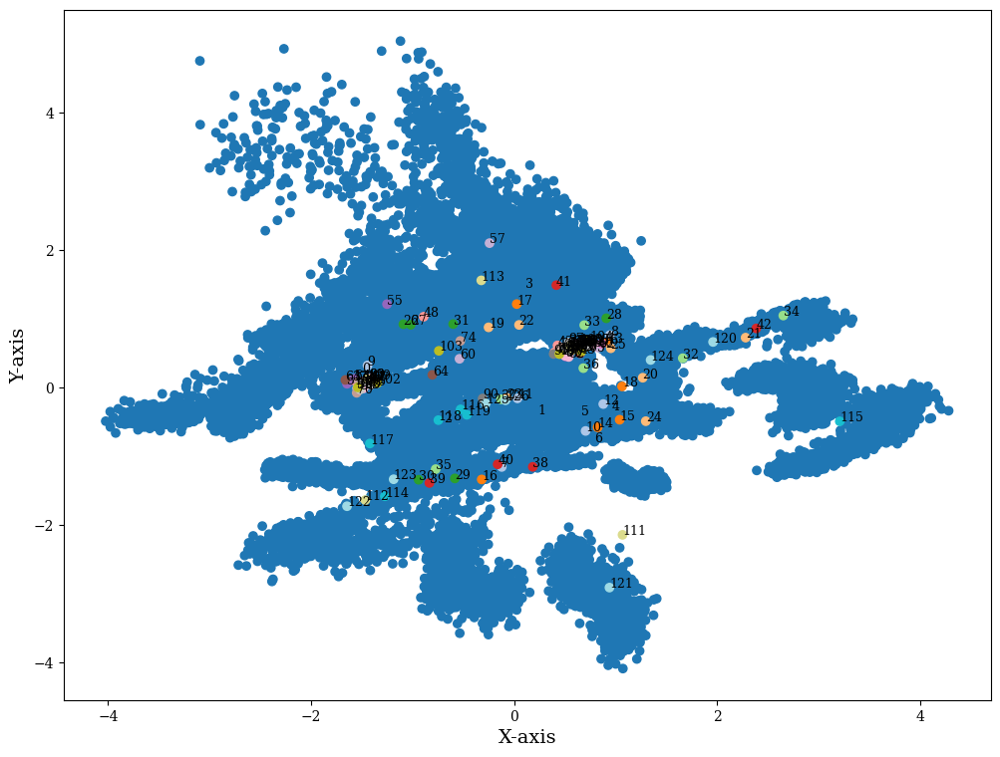

In [124]:
if refined_latent_means.shape[1]>2:
    reduction_technique = 'PCA'
    rls=reduce_dimensions_combined_latent_space(train_latent=latent_means,
                                        val_latent=refined_latent_means,
                                        techniques=[reduction_technique])

    plot_combined_2d_latent_space(
    real_latent=rls[reduction_technique]['train'], 
    synthetic_latent=rls[reduction_technique]['val'],
    synthetic_labels=list(range(0, len(refined_scaled_data))),
    annotation_mode='numbers',
    save_path=combined_latent_space_path
    )

else:
    plot_combined_2d_latent_space(
        real_latent=latent_means, 
        synthetic_latent=refined_latent_means,
        synthetic_labels=list(range(0, len(refined_scaled_data))),
        annotation_mode='numbers',
        save_path=combined_latent_space_path
    )

In [125]:
scaled_generation = scaler.transform(torch.from_numpy(generation).float())
latent_generation_means, _ = model.encode(scaled_generation)
latent_generation_means = latent_generation_means.detach().numpy()
latent_generation_means_that_refined = latent_generation_means[refined_ids]

if refined_latent_means.shape[1]>2:
    latent_generation_means_that_refined_2d=reduce_dimensions_latent_space(latent_generation_means_that_refined,
                                    np.array(range(len(latent_generation_means_that_refined))),
                                    techniques=[reduction_technique], show_legend=False, plot=False)
    generation_to_refinement = np.stack((latent_generation_means_that_refined_2d[reduction_technique], rls[reduction_technique]['val']), axis=1)
else:
    generation_to_refinement = np.stack((latent_generation_means_that_refined, refined_latent_means), axis=1)

generation_to_refinement.shape

(127, 2, 2)

Saved plot to ../experiments/experiment_36/images/exp36_combined_latent_space_arrows


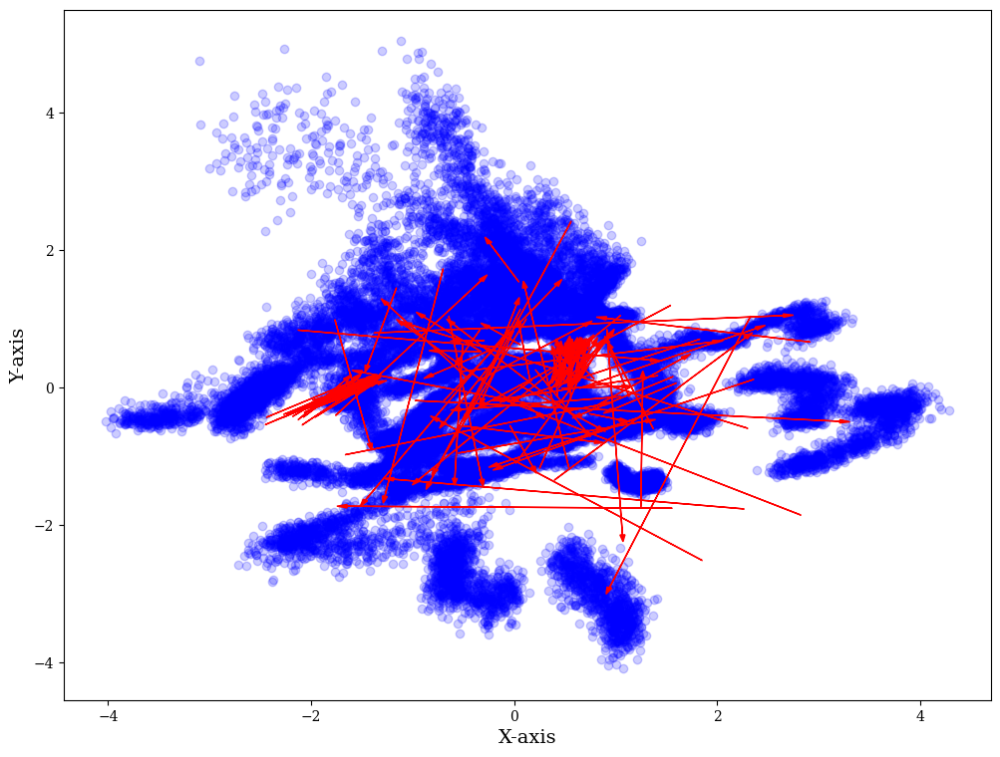

In [126]:
if refined_latent_means.shape[1]>2:
    reduction_technique = 'PCA'
    rls=reduce_dimensions_combined_latent_space(train_latent=latent_means,
                                        val_latent=refined_latent_means,
                                        techniques=[reduction_technique])

    plot_combined_2d_latent_space(
        real_latent=rls[reduction_technique]['train'], 
        synthetic_latent=generation_to_refinement,
        annotation_mode='numbers',
        save_path=combined_latent_space_arrows_path
    )

else:
    plot_combined_2d_latent_space(
        real_latent=latent_means, 
        synthetic_latent=generation_to_refinement,
        annotation_mode='numbers',
        save_path=combined_latent_space_arrows_path
    )

In [127]:
generation_to_refinement_latent_distance = calculate_pairwise_distances(latent_generation_means_that_refined, refined_latent_means, distance_metric=params['distance_metric'])
refined_orbits_df['latent_distance_to_generation'] = generation_to_refinement_latent_distance

## Features

Calculate Jacobi Constant on the dataset

In [128]:
results = np.array([jacobi_constant(np.transpose(full_data[:,1:,:],(0,2,1))[i][0], EM_MU)[0] for i in range(full_data.shape[0])])
full_orbit_df['calculated_jacobi'] = results

full_orbit_df.head()

,id_class,x_0,y_0,x_0,vx_0,vy_0,vz_0,jacobi,period,stability,propagated_periods,calculated_jacobi
0,1.0,0.941000,1.900442e-23,0.509474,2.968938e-13,-0.124968,-3.122717e-12,2.745412,11.555291,211.184678,3.0,2.757415
1,1.0,0.941538,-8.592698e-24,0.508602,2.902340e-13,-0.125672,-3.252212e-12,2.746226,11.551622,210.329145,3.0,2.758229
2,1.0,0.942076,6.956604e-24,0.507729,2.685527e-13,-0.126375,-2.862050e-12,2.747039,11.547936,209.473685,3.0,2.759042
3,1.0,0.942613,1.763946e-24,0.506856,3.153637e-13,-0.127078,-3.791054e-12,2.747850,11.544233,208.618315,3.0,2.759853
4,1.0,0.943150,9.441804e-24,0.505982,2.663322e-13,-0.127781,-2.982720e-12,2.748660,11.540511,207.763051,3.0,2.760663


Calculate Jacobi Constant and Period on the Refined Orbits

In [129]:
new_jacobis = np.array([jacobi_constant(np.transpose(refined_orbits[:,1:,:],(0,2,1))[i][0], EM_MU)[0] for i in range(refined_orbits.shape[0])])
refined_orbits_df['calculated_jacobi'] = new_jacobis
refined_orbits_df.rename(columns={'new_period': 'period'}, inplace=True)
refined_orbits_df['period_distance_with_generation'] = abs(refined_orbits_df['period'] - refined_orbits_df['old_period'])
refined_orbits_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance,closest_family_full_centroid,closest_family_full_centroid_distance,family_of_feature_closest_orbit,family_of_closest_orbit,disorder_metric,correct_order,inversions,kendall_tau_distance
0,0,6.395186,6.302522,7,1.398596e-11,0.769955,-0.393026,0.352113,-0.005749,-0.803771,-0.795254,0.735167,-0.476966,0.470570,-0.008378,-0.863155,-0.870847,60.0,82.0,35.0,0.014141,1.202996e-12,2.607413e-12,4.593562e-12,2.906873,1.278837,0.092664,30810,0.000859,30787,1.967273,2.786773,2.498253,1.473080,22,1.045556,10,0.299181,0.177583,26,1.053487,29.0,29.0,60.0,82.0,35.0,0.014141
1,2,5.998624,6.255559,14,1.354334e-10,0.251780,0.041392,0.689512,0.042365,-0.958140,-0.089070,0.009184,0.019214,0.995652,0.038575,-1.011370,0.018985,246.0,66.0,163.0,0.065859,4.144731e-12,1.060093e-11,1.094821e-11,2.329807,0.988646,0.256935,24263,0.000219,24301,6.195145,6.856746,1.757369,1.731676,17,0.929396,10,0.182968,0.409377,20,0.926122,21.0,21.0,246.0,66.0,163.0,0.065859
2,3,5.981030,6.265392,11,2.048925e-11,-1.211178,0.040455,-0.025998,0.017210,1.422636,0.134127,-1.552693,-0.074010,-0.022109,-0.098701,1.704606,0.509757,112.0,77.0,75.0,0.030303,1.252723e-12,3.130156e-12,2.870088e-12,3.059297,0.543481,0.284362,19684,0.000526,19717,4.485208,5.281586,3.046467,2.106530,13,0.679406,15,0.169371,0.603150,16,0.682743,17.0,17.0,112.0,77.0,75.0,0.030303
3,4,3.780626,3.294795,8,8.885266e-11,1.299808,0.030334,-0.125091,0.034437,-0.423233,0.008879,1.163669,-0.001031,-0.114950,-0.000904,-0.203748,0.001111,232.0,69.0,148.0,0.059798,1.681428e-12,5.085804e-12,2.355566e-12,2.813566,3.112600,0.485831,14967,0.000247,16529,0.682594,2.393911,2.052801,4.021441,11,0.458928,27,0.595025,0.262876,13,0.457670,13.0,14.0,232.0,69.0,148.0,0.059798
4,7,12.725389,12.549174,18,2.991717e-10,0.499166,0.115313,-0.003062,0.056219,0.841462,-0.016488,0.409168,-0.079558,-0.008749,0.122948,1.385672,0.151695,68.0,85.0,38.0,0.015354,5.979997e-12,1.528911e-11,8.685658e-12,0.783118,2.876062,0.176215,41484,0.003867,41526,3.864567,4.026240,1.537191,5.316860,31,0.383732,36,0.440313,0.612380,36,0.386488,39.0,39.0,68.0,85.0,38.0,0.015354


Compare Features between Dataset and Refinement

Saved plot to ../experiments/experiment_36/images/exp36_features


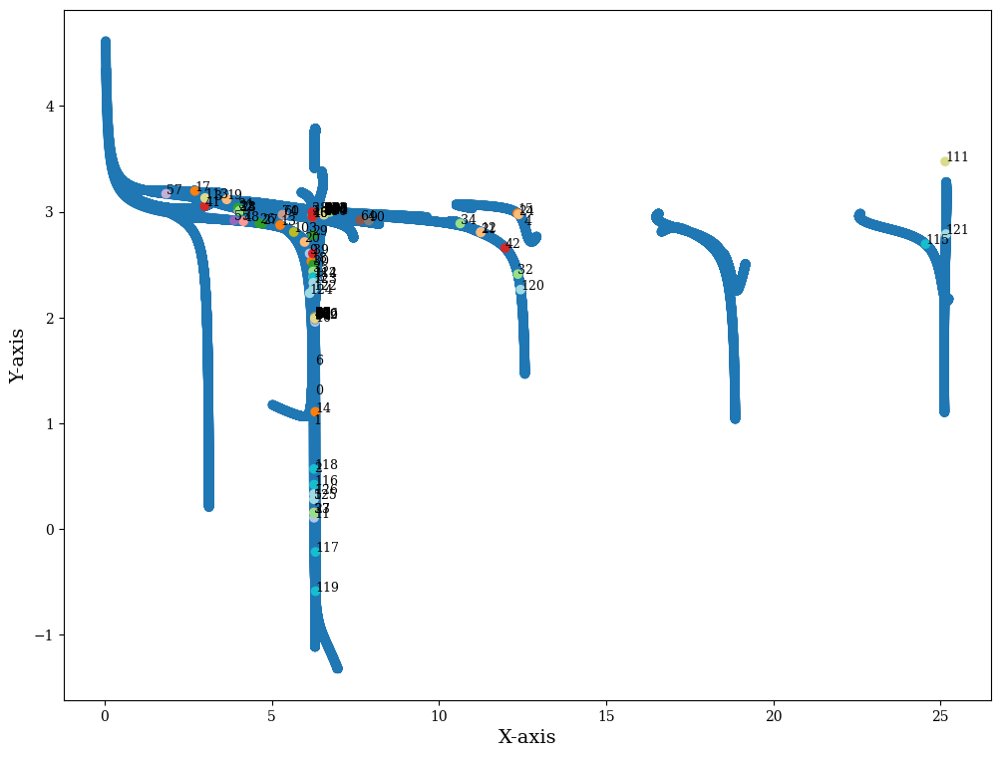

In [130]:
features_used = ['period', 'calculated_jacobi']

dataset_features = full_orbit_df[features_used].values
refined_orbits_features = refined_orbits_df[features_used].values 

closest_feature_indices, feature_distances = find_nearest_points_batch(refined_orbits_features, dataset_features,
                                                                       n=1, distance_metric=params['distance_metric'])

refined_orbits_df['feature_closest_orbit'] = closest_feature_indices
refined_orbits_df['feature_distance_from_closest_orbit'] = feature_distances

plot_combined_2d_latent_space(dataset_features, refined_orbits_features,
                              synthetic_labels=list(range(0, len(refined_scaled_data))),
                              annotation_mode='numbers', save_path=features_plot_path)

Feature Centroids

In [131]:
array_features = full_orbit_df[features_used].to_numpy()
feature_centroid = full_orbit_df[features_used].mean().to_numpy()
feature_centroids = compute_centroids(array_features, full_orbits_id_classes, method='mean')
feature_centroids.shape

(40, 2)

In [132]:
stdev_feature_centroids  = full_orbit_df.groupby('id_class')[features_used].std().values
stdev_feature_centroids.shape

(40, 2)

In [133]:
feature_centroid = full_orbit_df[features_used].mean().values
feature_centroid.shape

(2,)

In [134]:
full_unique_classes = list(set(full_orbits_id_classes))
full_family_names=get_orbit_classes(full_unique_classes)[0]
len(full_family_names)

40

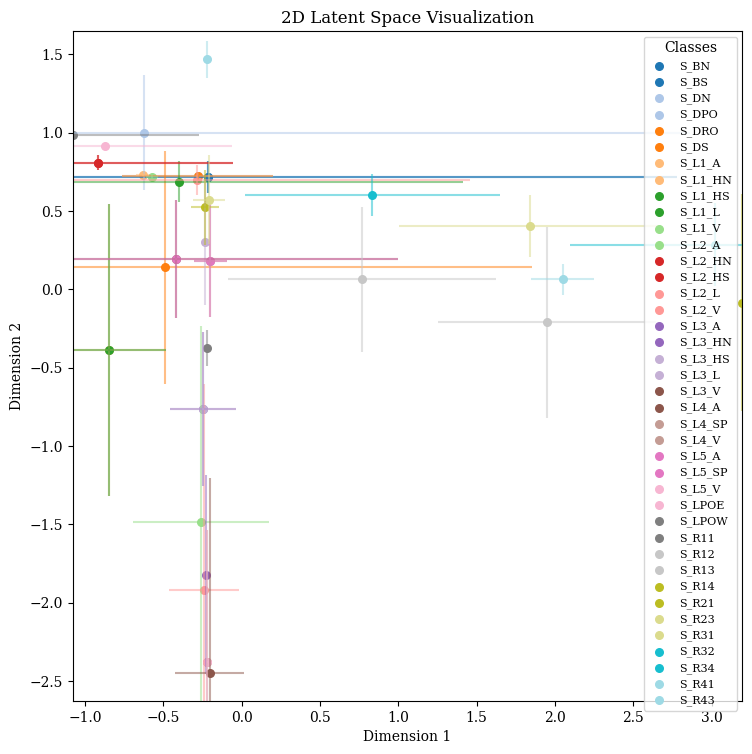

In [135]:
if len(features_used)==2:
    plot_2d_latent_space(feature_centroids,np.array(full_family_names), latent_stdevs=stdev_feature_centroids, save_path=family_feature_centroids_plot_path)

## Calculate distances

In [136]:
if data.shape[1] == 7:
    no_time_data = full_data[:,1:,:]
    no_time_refined_orbits = refined_orbits[:,1:,:]
    no_time_generated_data_that_was_refined = generated_data_that_was_refined[:,1:,:]
else:
    no_time_data = full_data
    no_time_refined_orbits = refined_orbits
    no_time_generated_data_that_was_refined = generated_data_that_was_refined

print(no_time_data.shape)
print(no_time_refined_orbits.shape)
print(no_time_generated_data_that_was_refined.shape)
print(no_time_generation.shape)


(45211, 6, 100)
(127, 6, 100)
(127, 6, 100)
(300, 6, 100)


### Orbit Distances

1. Nearest Orbit

In [137]:
nearest_indices_generation, nearest_distances_generation = find_nearest_orbits_batch(no_time_generation,
                                                                                     no_time_data,
                                                                                     n=1,
                                                                                     distance_metric=params['distance_metric'])
generation_df['nearest_orbit'] = nearest_indices_generation
generation_df['nearest_orbit_distance'] = nearest_distances_generation

In [138]:
nearest_indices_refined_generation, nearest_distances_refined_generation = find_nearest_orbits_batch(no_time_refined_orbits,
                                                                                                     no_time_data,
                                                                                                     n=1,
                                                                                                     distance_metric=params['distance_metric'])
refined_orbits_df['nearest_orbit'] = nearest_indices_refined_generation
refined_orbits_df['nearest_orbit_distance'] = nearest_distances_refined_generation

2. Generation vs Refinement

In [139]:
pairwise_distances = calculate_pairwise_orbit_distances(no_time_generated_data_that_was_refined,
                                                        no_time_refined_orbits, distance_metric=params['distance_metric'])
refined_orbits_df['distance_from_generation'] = pairwise_distances

### Point Distances

3. Distance from the centre

In [140]:
# Latent space distance
centroid_distances = calculate_distances_batch(full_data_centroid, refined_latent_means, distance_metric=params['distance_metric'])
refined_orbits_df['centroid_distance'] = centroid_distances

In [141]:
# Feature distance
feature_centroid_distances = calculate_distances_batch(feature_centroid, refined_orbits_features, distance_metric=params['distance_metric'])
refined_orbits_df['feature_centroid_distance'] = feature_centroid_distances

4. Distance from centroids

In [142]:
# Latent Space Centroids
closest_family_centroid, closest_family_centroid_distance = find_nearest_points_batch(refined_latent_means, centroid_means, n=1, distance_metric=params['distance_metric'])
refined_orbits_df['closest_family_centroid'] = closest_family_centroid
refined_orbits_df['closest_family_centroid_distance'] = closest_family_centroid_distance

In [143]:
# Feature Space Centroids
closest_family_feature_centroid, closest_family_feature_centroid_distance = find_nearest_points_batch(refined_orbits_features, feature_centroids, n=1, distance_metric=params['distance_metric'])
refined_orbits_df['closest_family_feature_centroid'] = closest_family_feature_centroid
refined_orbits_df['closest_family_feature_centroid_distance'] = closest_family_feature_centroid_distance

5. Initial Conditions

In [144]:
# Extract initial and final conditions
initial_conditions = refined_orbits_df[['initial_pos_x0', 'initial_pos_y0', 'initial_pos_z0',
                        'initial_vel_x0', 'initial_vel_y0', 'initial_vel_z0']].values
final_conditions = refined_orbits_df[['final_pos_x0', 'final_pos_y0', 'final_pos_z0',
                      'final_vel_x0', 'final_vel_y0', 'final_vel_z0']].values

ics_distances = calculate_pairwise_distances(initial_conditions, final_conditions, distance_metric=params['distance_metric'])
refined_orbits_df['initial_conditions_distance'] = ics_distances

## Export Features

In [145]:
generation_df.to_csv(generation_df_path, index=False)
generation_df.shape

(300, 9)

In [146]:
generation_df.head()

,position_error,velocity_error,energy_error,disorder_metric,correct_order,inversions,kendall_tau_distance,nearest_orbit,nearest_orbit_distance
0,0.139224,0.242180,1.176531,176.0,78.0,119.0,0.048081,38650,2.017949
1,0.192839,0.349629,0.500636,150.0,71.0,95.0,0.038384,20514,7.643072
2,0.156858,0.293211,1.186323,296.0,67.0,189.0,0.076364,9488,4.995589
3,0.136351,0.212304,0.173753,454.0,65.0,324.0,0.130909,9197,3.777572
4,0.127103,0.208509,0.350759,128.0,77.0,81.0,0.032727,24480,4.538318


In [147]:
refined_orbits_df.to_csv(refined_orbits_df_path, index=False)
refined_orbits_df.shape

(127, 47)

In [148]:
refined_orbits_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance,closest_family_full_centroid,closest_family_full_centroid_distance,family_of_feature_closest_orbit,family_of_closest_orbit,disorder_metric,correct_order,inversions,kendall_tau_distance
0,0,6.395186,6.302522,7,1.398596e-11,0.769955,-0.393026,0.352113,-0.005749,-0.803771,-0.795254,0.735167,-0.476966,0.470570,-0.008378,-0.863155,-0.870847,60.0,82.0,35.0,0.014141,1.202996e-12,2.607413e-12,4.593562e-12,2.906873,1.278837,0.092664,30810,0.000859,30787,1.967273,18.067548,2.529452,1.473080,22,1.137199,10,0.299181,0.177583,26,1.053487,29.0,29.0,60.0,82.0,35.0,0.014141
1,2,5.998624,6.255559,14,1.354334e-10,0.251780,0.041392,0.689512,0.042365,-0.958140,-0.089070,0.009184,0.019214,0.995652,0.038575,-1.011370,0.018985,246.0,66.0,163.0,0.065859,4.144731e-12,1.060093e-11,1.094821e-11,2.329807,0.988646,0.256935,24263,0.000219,24301,6.195145,17.485866,1.752072,1.731676,17,0.774913,10,0.182968,0.409377,20,0.926122,21.0,21.0,246.0,66.0,163.0,0.065859
2,3,5.981030,6.265392,11,2.048925e-11,-1.211178,0.040455,-0.025998,0.017210,1.422636,0.134127,-1.552693,-0.074010,-0.022109,-0.098701,1.704606,0.509757,112.0,77.0,75.0,0.030303,1.252723e-12,3.130156e-12,2.870088e-12,3.059297,0.543481,0.284362,19684,0.000526,19717,4.485208,24.355919,2.807363,2.106530,13,0.471571,15,0.169371,0.603150,16,0.682743,17.0,17.0,112.0,77.0,75.0,0.030303
3,4,3.780626,3.294795,8,8.885266e-11,1.299808,0.030334,-0.125091,0.034437,-0.423233,0.008879,1.163669,-0.001031,-0.114950,-0.000904,-0.203748,0.001111,232.0,69.0,148.0,0.059798,1.681428e-12,5.085804e-12,2.355566e-12,2.813566,3.112600,0.485831,14967,0.000247,16529,0.682594,20.105916,2.009000,4.021441,11,0.727810,27,0.595025,0.262876,13,0.457670,13.0,14.0,232.0,69.0,148.0,0.059798
4,7,12.725389,12.549174,18,2.991717e-10,0.499166,0.115313,-0.003062,0.056219,0.841462,-0.016488,0.409168,-0.079558,-0.008749,0.122948,1.385672,0.151695,68.0,85.0,38.0,0.015354,5.979997e-12,1.528911e-11,8.685658e-12,0.783118,2.876062,0.176215,41484,0.003867,41526,3.864567,5.938849,1.636447,5.316860,31,0.353873,36,0.440313,0.612380,36,0.386488,39.0,39.0,68.0,85.0,38.0,0.015354


In [149]:
not_to_show_columns = ['initial_pos_x0','initial_pos_y0','initial_pos_z0',	'initial_vel_x0',	'initial_vel_y0',	'initial_vel_z0	final_pos_x0',	'final_pos_y0',	'final_pos_z0',	'final_vel_x0',	'final_vel_y0',	'final_vel_z0', 'inversions',	'kendall_tau_distance' , 'closest_feature_indices',	'nearest_orbit', 'closest_family_centroid', 'closest_family_feature_centroid']

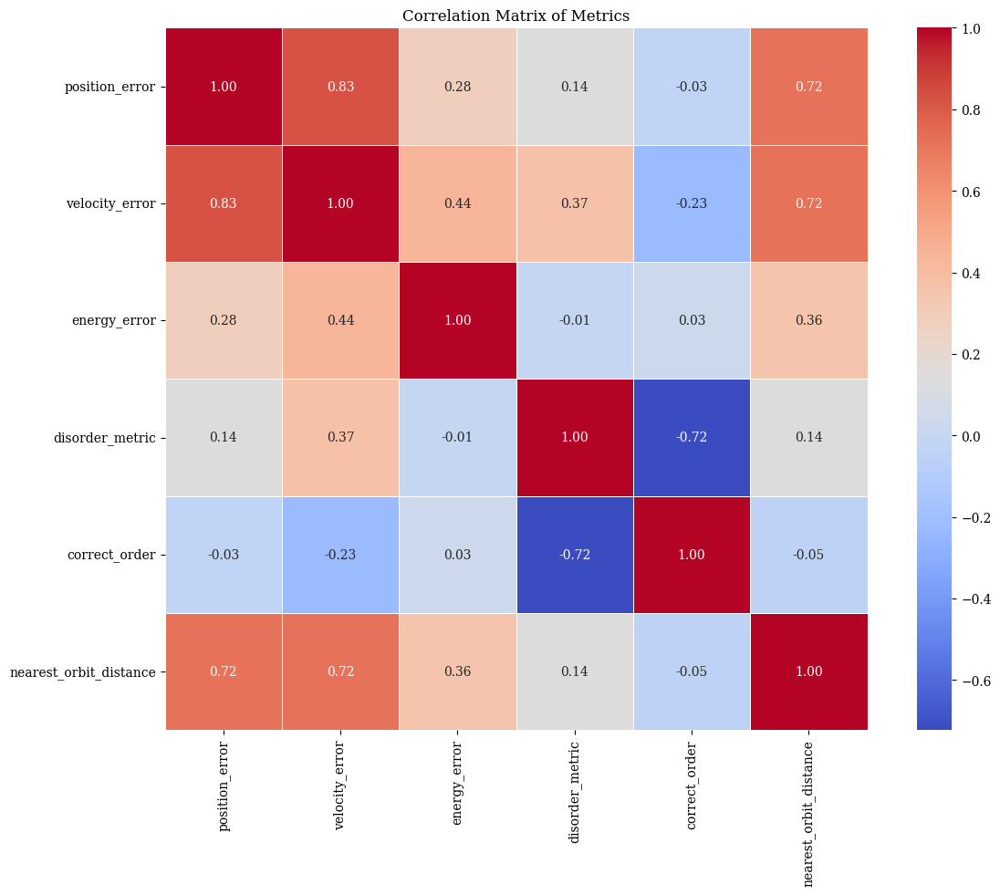

In [150]:
plot_corr_matrix(generation_df.drop(columns=not_to_show_columns, errors='ignore'))

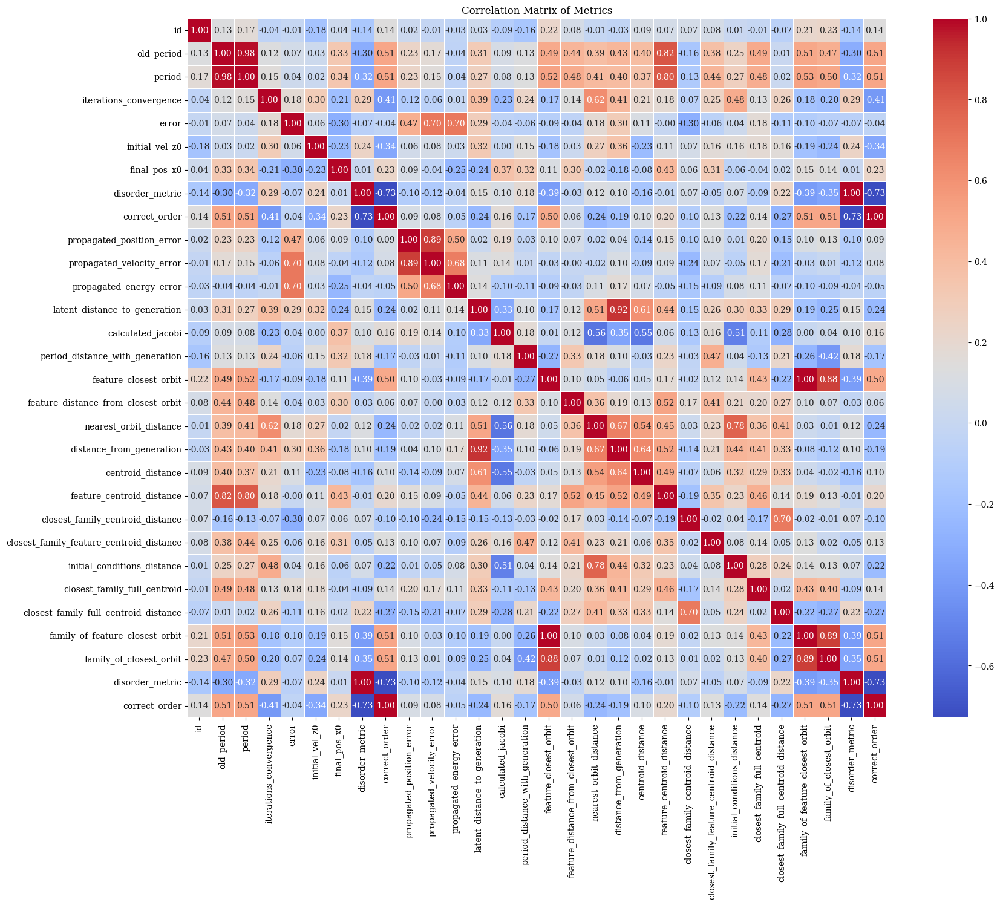

In [151]:
plot_corr_matrix(refined_orbits_df.drop(columns=not_to_show_columns, errors='ignore'), figsize=(20,15))

# Check Discovery

Calculate Full Centroid Distances

In [152]:
# Recalculate distance from latent space centroids
closest_family_centroid, closest_family_centroid_distance = find_nearest_points_batch(refined_latent_means, full_centroid_means, n=1, distance_metric=params['distance_metric'])
refined_orbits_df['closest_family_full_centroid'] = closest_family_centroid
refined_orbits_df['closest_family_full_centroid_distance'] = closest_family_centroid_distance

In [153]:
family_mapping = full_orbit_df['id_class'].to_dict()

def get_class_name(orbit_id):
    return family_mapping.get(orbit_id, None)

refined_orbits_df['family_of_feature_closest_orbit'] = refined_orbits_df['feature_closest_orbit'].apply(get_class_name)
refined_orbits_df['family_of_closest_orbit'] = refined_orbits_df['nearest_orbit'].apply(get_class_name)
refined_orbits_df.to_csv(refined_orbits_df_path, index=False)
refined_orbits_df.shape

(127, 47)

In [154]:
family_columns = ['family_of_feature_closest_orbit', 'family_of_closest_orbit', 'closest_family_feature_centroid','closest_family_full_centroid']
filter_condition = refined_orbits_df[family_columns].isin(discarded_family_ids).any(axis=1)
close_discovery_df = refined_orbits_df[filter_condition]
close_discovery_df.shape

(24, 47)

In [155]:
close_discovery_df[family_columns].head()

,family_of_feature_closest_orbit,family_of_closest_orbit,closest_family_feature_centroid,closest_family_full_centroid
2,17.0,17.0,15,16
13,11.0,7.0,9,5
17,10.0,10.0,27,6
18,22.0,24.0,19,22
19,2.0,15.0,6,11


In [156]:
filter_condition = refined_orbits_df[['family_of_feature_closest_orbit', 'family_of_closest_orbit']].isin(discarded_family_ids).any(axis=1)
discovery_df = refined_orbits_df[filter_condition]
discovery_df.shape

(14, 47)

In [157]:
family_orbit_columns = ['id','feature_closest_orbit', 'nearest_orbit', 'family_of_feature_closest_orbit', 'family_of_closest_orbit', 'closest_family_feature_centroid','closest_family_full_centroid']
discovery_df[family_orbit_columns]

,id,feature_closest_orbit,nearest_orbit,family_of_feature_closest_orbit,family_of_closest_orbit,closest_family_feature_centroid,closest_family_full_centroid
13,23,12734,7183,11.0,7.0,9,5
18,33,25057,26618,22.0,24.0,19,22
19,34,2138,18053,2.0,15.0,6,11
48,107,25363,5430,22.0,5.0,6,9
55,117,25385,5439,22.0,5.0,6,9
63,126,24738,27930,22.0,26.0,29,10
64,127,17230,5445,15.0,5.0,35,14
80,151,24747,27940,22.0,26.0,29,10
83,156,24742,27927,22.0,26.0,29,10
89,166,24761,27950,22.0,26.0,29,10


In [158]:
discarded_family_ids

[6.0, 31.0, 15.0, 11.0, 22.0]

In [159]:
refinement_indexes = discovery_df.index.to_list()
feature_closest_orbit_indexes = discovery_df['feature_closest_orbit'].to_list()
nearest_orbit_indexes = discovery_df['nearest_orbit'].to_list()

discovery_refinement = reordered_refined_orbits[refinement_indexes]
feature_closest_orbits = full_data[feature_closest_orbit_indexes]
nearest_orbits = full_data[nearest_orbit_indexes]

In [160]:
refinement_and_closers = np.stack(
    (discovery_refinement, feature_closest_orbits, nearest_orbits),
    axis=1
)
refinement_and_closers.shape

(14, 3, 7, 100)

## Visualize

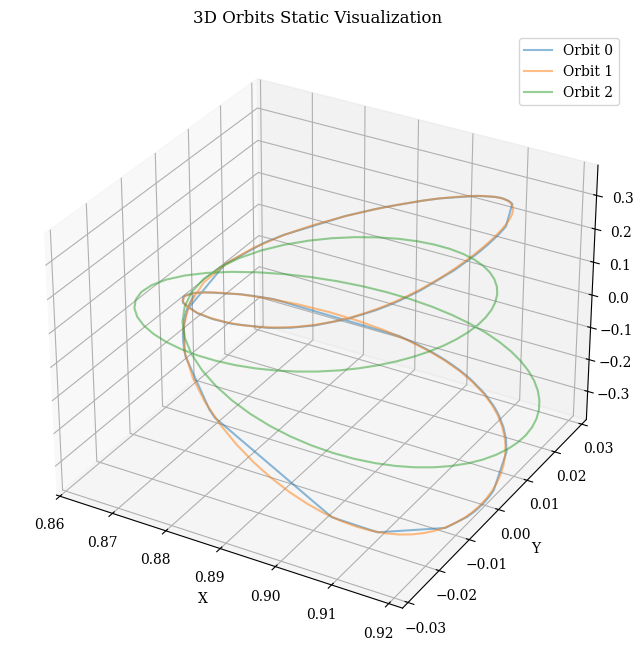

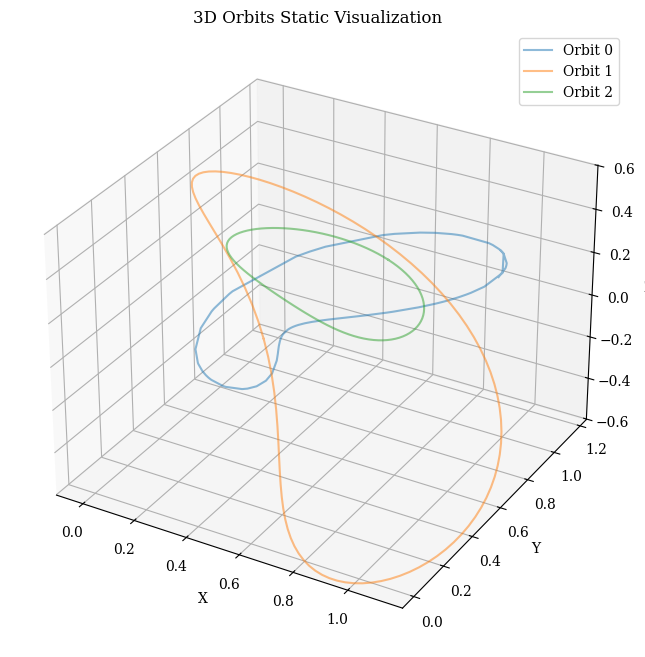

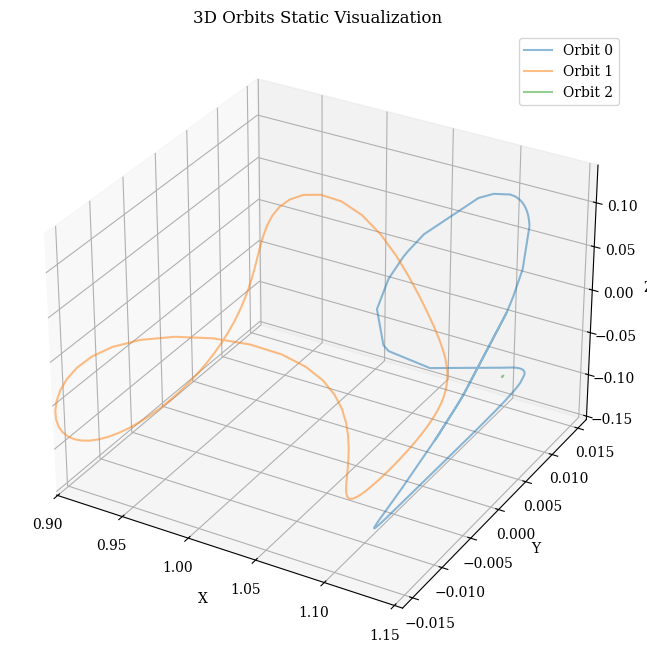

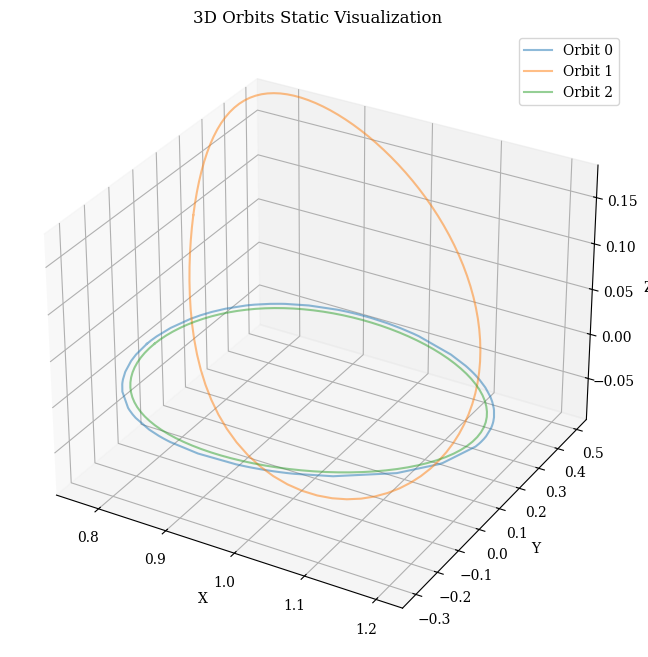

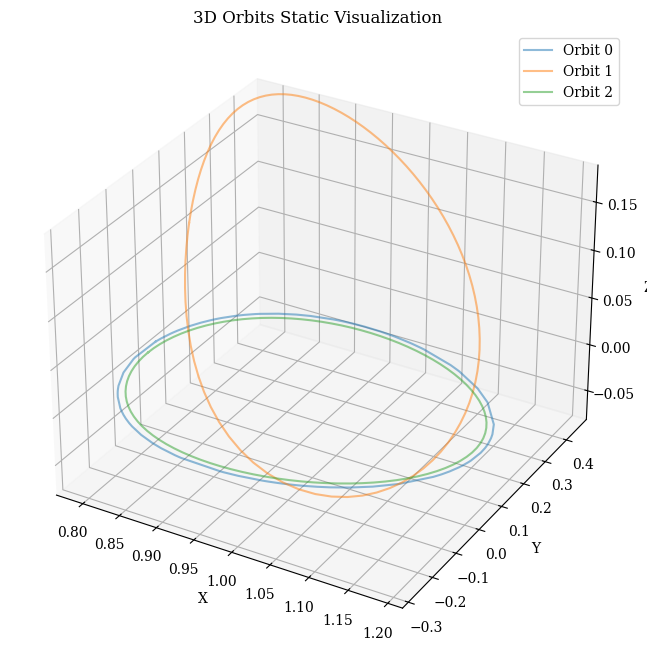

...

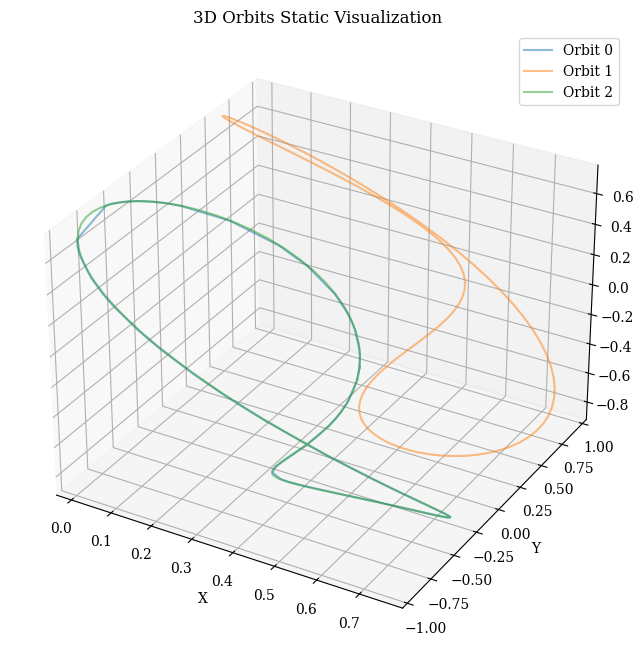

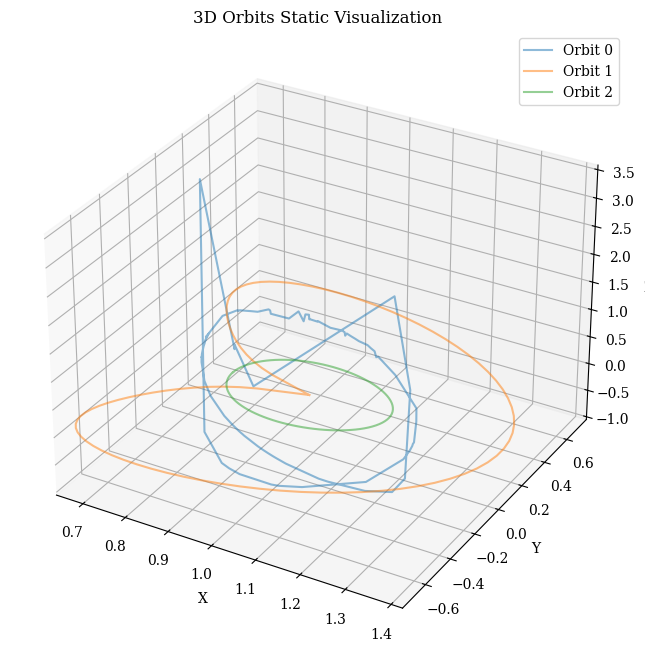

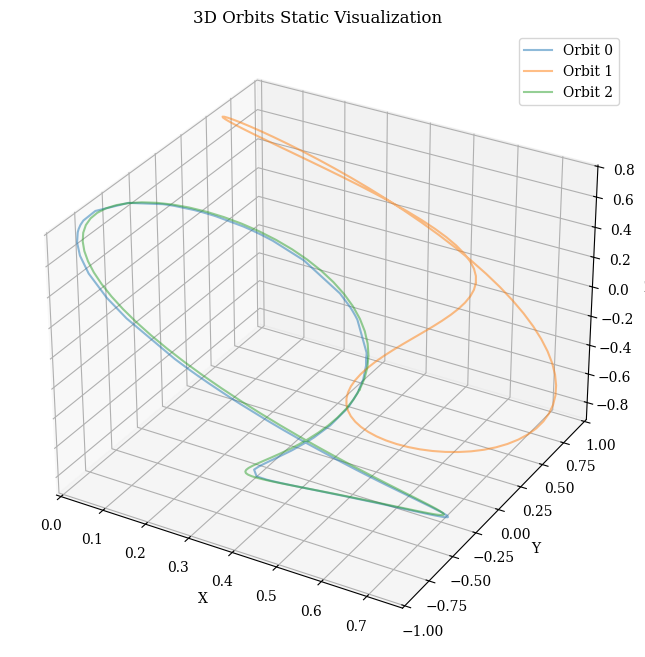

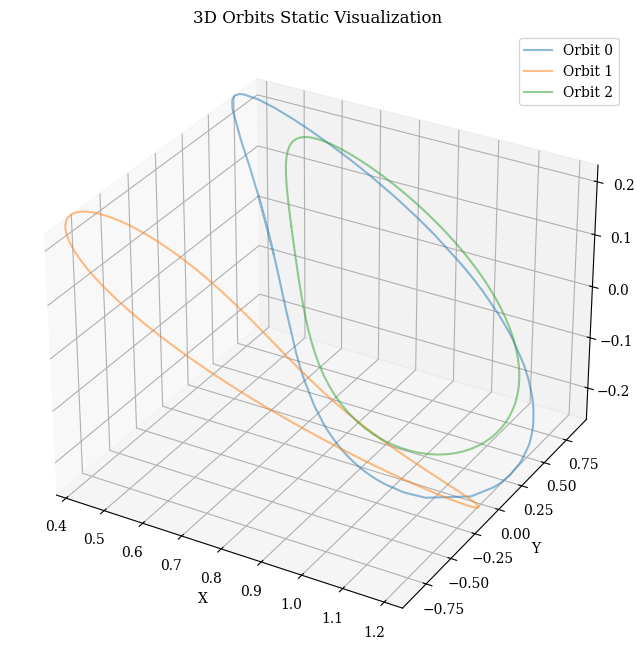

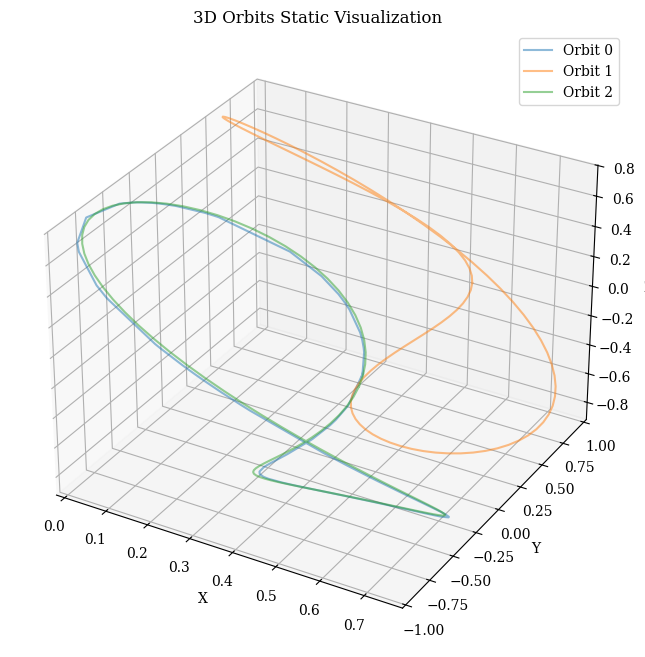

In [161]:
for i in range(len(refinement_and_closers)):
    visualize_static_orbits(refinement_and_closers[i,:,1:,:])

In [162]:
if latent_means.shape[1]==2:
    plot_combined_2d_latent_space(
        real_latent=latent_means, 
        synthetic_latent=generation_to_refinement[refinement_indexes],
        annotation_mode='numbers'
    )

In [163]:
discovery_generation_indexes = discovery_df['id'].values
discovery_generation = generation[discovery_generation_indexes]
discovery_generation.shape

(14, 7, 100)

In [164]:
discovery_generation_and_refinement = np.stack(
    (discovery_generation, discovery_refinement),
    axis=1
)
discovery_generation_and_refinement.shape

(14, 2, 7, 100)

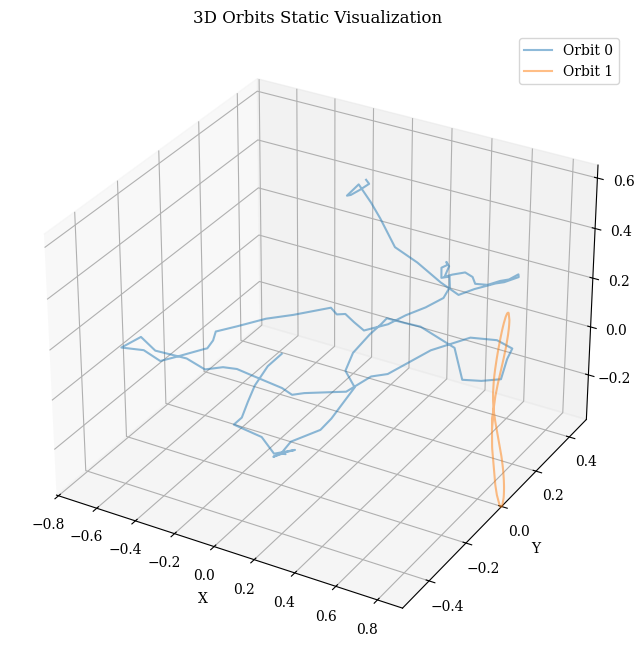

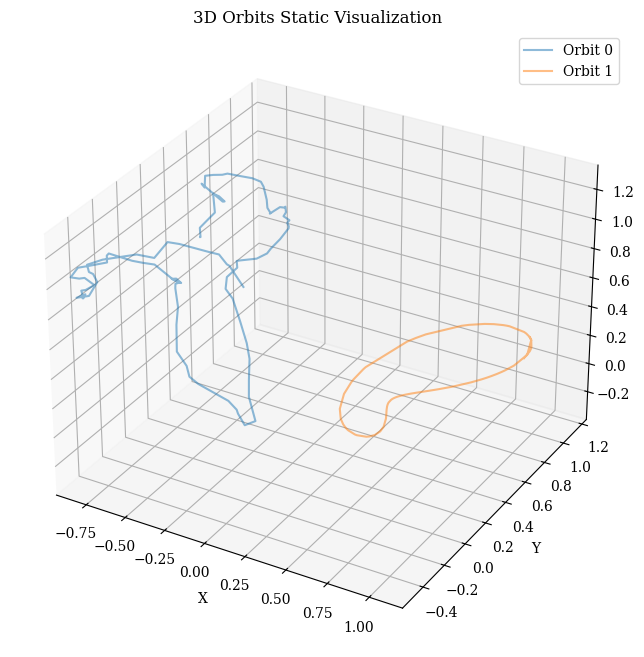

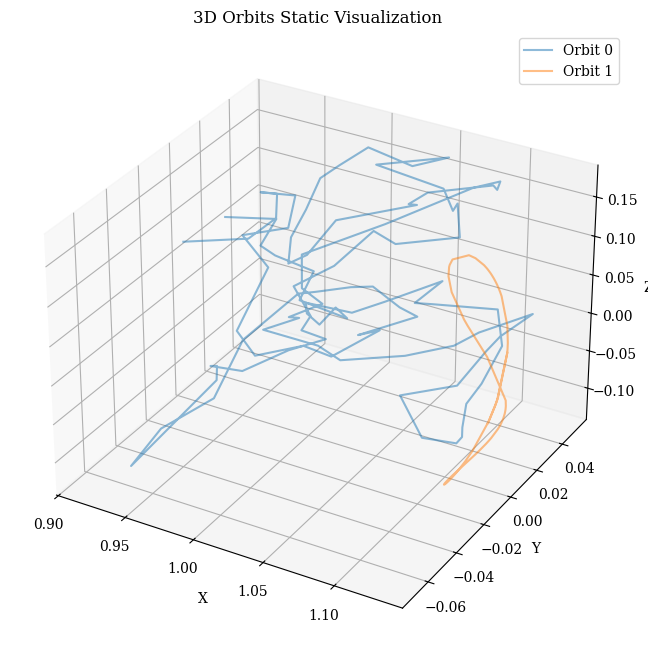

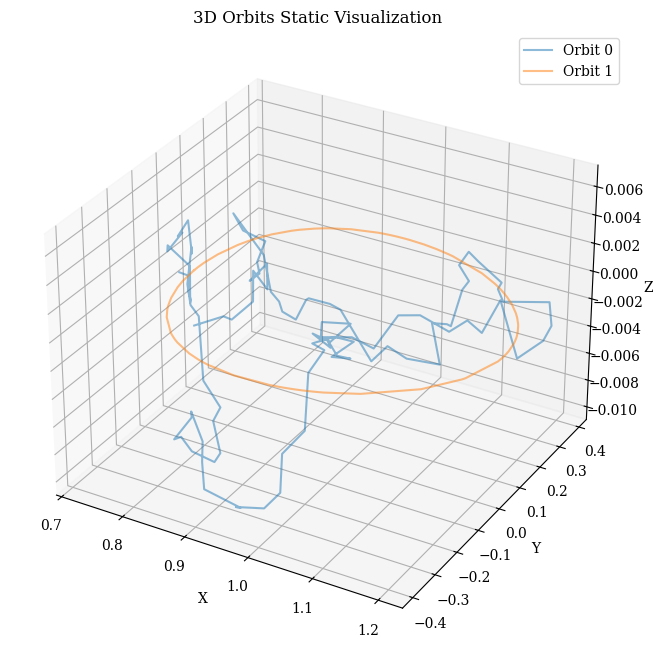

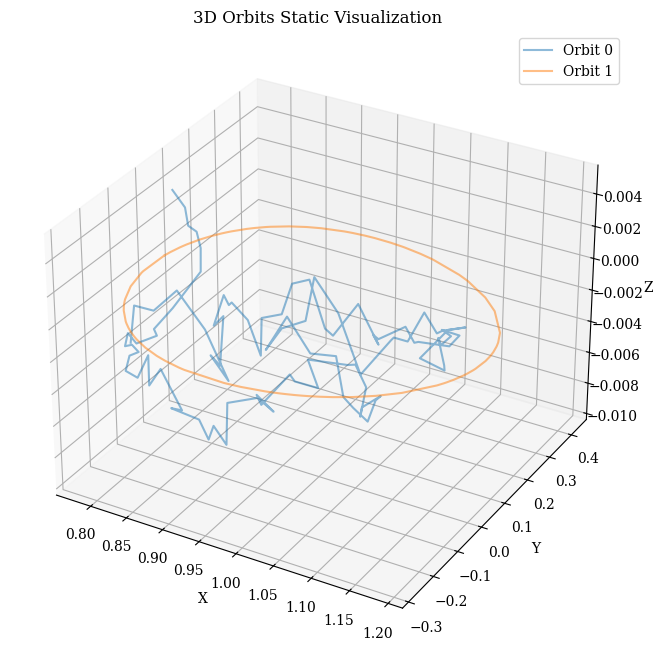

...

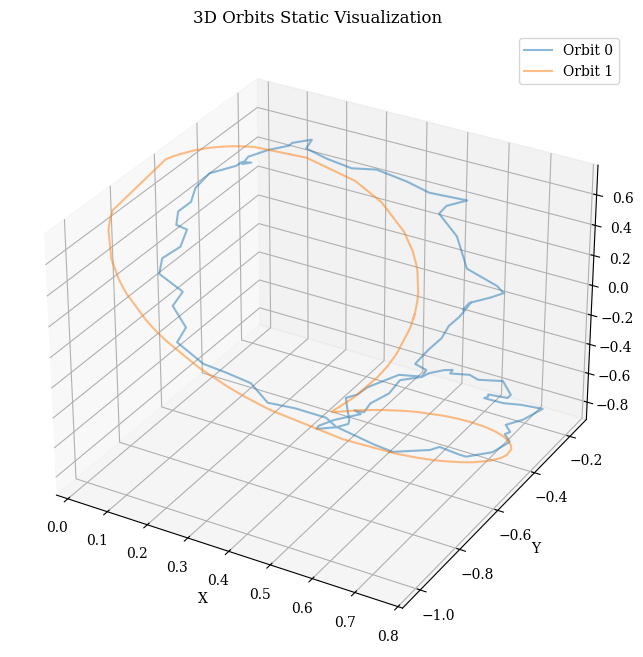

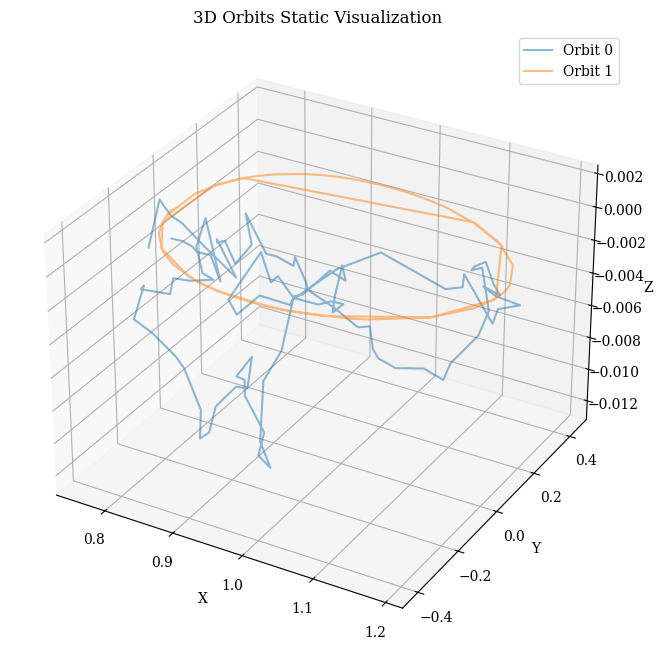

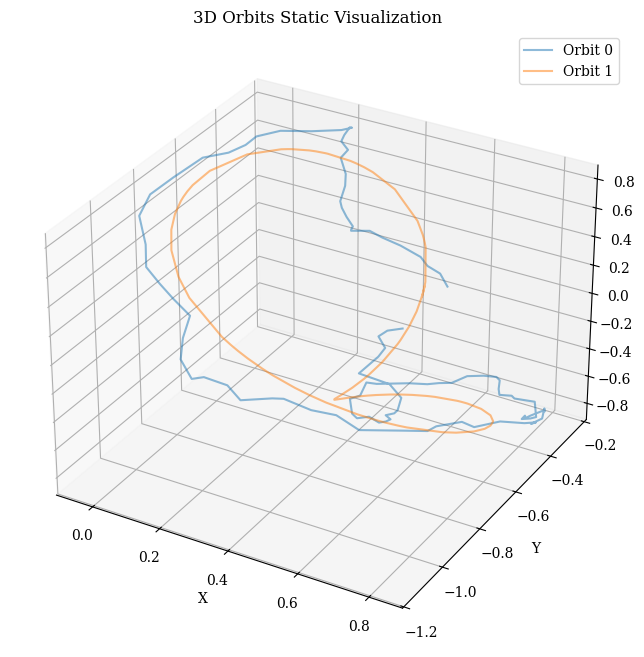

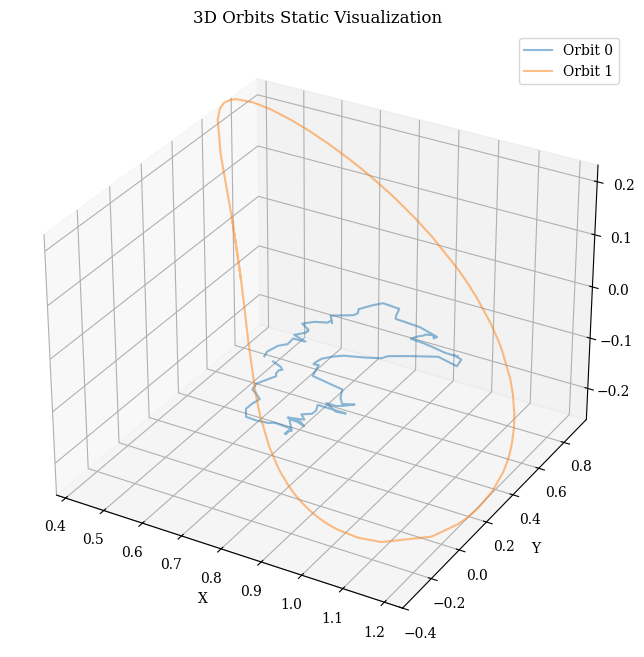

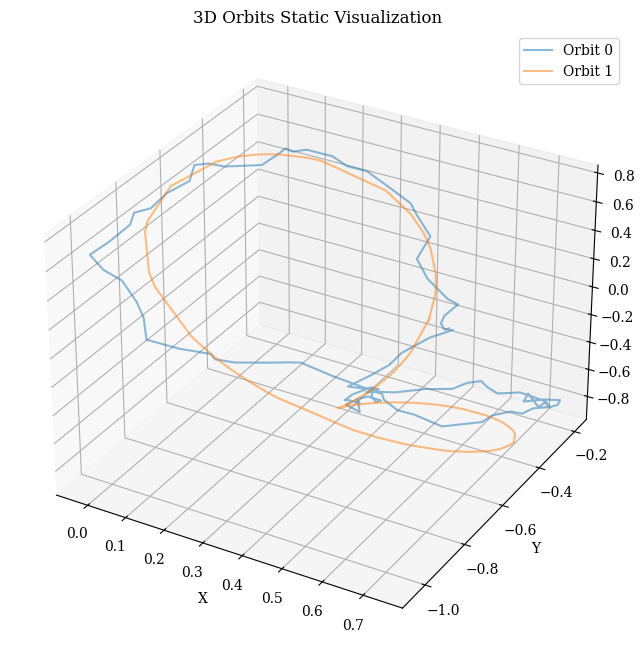

In [165]:
for i in range(len(discovery_generation_and_refinement)):
    visualize_static_orbits(discovery_generation_and_refinement[i,:,1:,:])